In [66]:
# Import packages

# Data processing and graphing
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import gridspec
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm

# Modeling
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split as tts
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBClassifier
from xgboost import XGBRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import f1_score
from sklearn import metrics

# Explainability
from sklearn.inspection import permutation_importance
import shap

In [2]:
###
### Read in data
###

In [3]:
# Read in Raberg data compilation (abbreviated Ra)
file1 = "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Data/Raberg_2022_data.xlsx"
data1 = pd.read_excel(file1, sheet_name= "Read")

In [4]:
# Read in Martinez-Sosa data compilation (abbreviated MS)
file2 = "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Data/Martinez-Sosa_2023_data.xlsx"
data2 = pd.read_excel(file2, sheet_name= "Read")

In [5]:
# Print out the column headers for both compilations
print(data1.columns)
print(data2.columns)

Index(['Index', 'Sample_ID', 'Type', 'Site', 'Country', 'Continent', 'Lat',
       'Lon', 'Elev', 'Temp', 'MAF', 'WMT', 'MAT', 'pH', 'MBT', 'CBT', 'IR',
       'fC', 'DC', 'Tetra', 'Penta', 'Hexa', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`',
       'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc',
       'IIIc`', 'Reference'],
      dtype='object')
Index(['Index', 'Sample_ID', 'Type', 'Site', 'Country', 'Continent', 'Lat',
       'Lon', 'Elev', 'WMT', 'MAT', 'pH', 'BIT', 'MBT', 'CBT', 'IR', 'fC',
       'DC', 'R_i/b', 'Tetra', 'Penta', 'Hexa', 'GDGT0', 'GDGT1', 'GDGT2',
       'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb',
       'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc',
       'IIIc`', 'Reference'],
      dtype='object')


In [6]:
# Isolate the columns containing just brGDGT data from both compilations for plotting ternary diagrams
data1br= data1.loc[:,['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']]
data2br= data2.loc[:,['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']]
data2_2 = pd.read_excel(file2, sheet_name= "Read2") #Almost same data as above just separating proportions by iso- and brGDGTs
data2_2 = data2_2[data2_2['GDGT0'].notna()]

In [7]:
###
### Visualize GDGT distributions: PCA, ternary diagrams, and bar plots
###

In [8]:
# PCA of Ra brGDGT
pca1 = PCA(n_components=15)
pca1.fit(data1br.to_numpy())
comp_list1= list(range(1, 16))
pca1_var= pd.DataFrame(data= {"component #":comp_list1,"variance (%)": pca1.explained_variance_ratio_*100})
pca1_var.iloc[:,[1]]= round(pca1_var.iloc[:,[1]], 2) #Turn scientific notation to floats
pca1_var

,component #,variance (%)
0,1,60.53
1,2,18.84
2,3,9.26
3,4,6.03
4,5,3.62
5,6,0.70
6,7,0.60
7,8,0.28
8,9,0.06
9,10,0.04


In [9]:
# Organize Ra PCA into dataframe for plotting
pca1_plot= pca1.transform(data1br.to_numpy())
pca1_plot= pd.DataFrame({'Comp 1':pca1_plot[:,0], 'Comp 2':pca1_plot[:,1], 'Comp 3':pca1_plot[:,2], 'Comp 4':pca1_plot[:,3], 'Comp 5': pca1_plot[:,4]})

In [10]:
# Reattach columns containing classification info to Ra PCA dataframe 
col_ext1= data1.loc[:,['Type', 'Site', 'Country', 'Continent', 'Lat', 'Lon', 'Elev', 'Temp', 'MAF', 'WMT', 'MAT', 'pH', 'MBT', 'CBT', 'IR', 'fC', 'DC', 'Tetra', 'Penta', 'Hexa']]
pca1_plot= pca1_plot.join(col_ext1)

In [11]:
# Custom color palettes for environment type and continent
type_palette = ['dodgerblue','navy','limegreen','orange','crimson']
cont_palette = ['lightcoral','gold','green','blue','darkviolet','sienna']

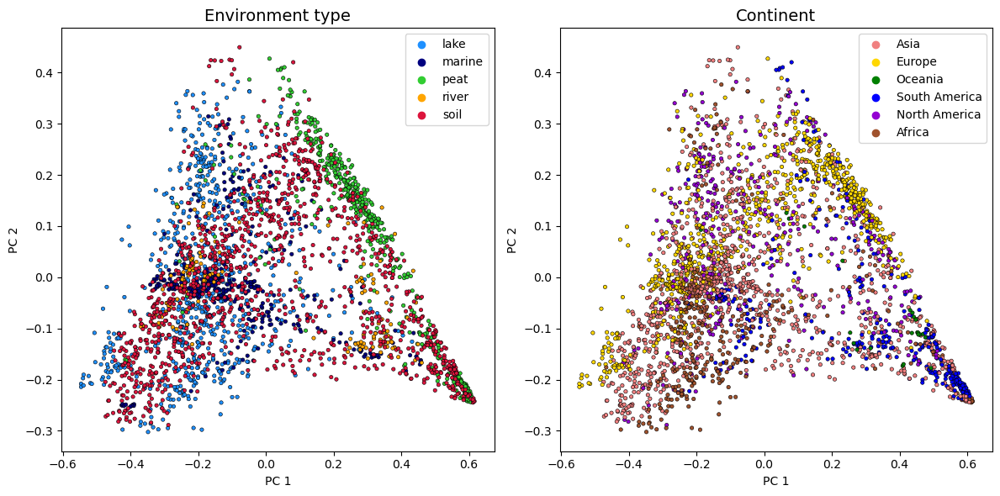

In [12]:
# Ra PCA plots
Fig, (ax1, ax2) = plt.subplots(1, 2)
sns.scatterplot(ax= ax1, data=pca1_plot.sort_values(by=['Type']), x='Comp 1', y='Comp 2', hue= 'Type', edgecolor= 'black', s= 10, linewidth= 0.4, palette=sns.color_palette(type_palette, 5))
ax1.set_title("Environment type", fontsize= 14)
ax1.set_xlabel('PC 1')
ax1. set_ylabel('PC 2')
ax1.legend_.set_title(None)
sns.scatterplot(ax= ax2, data=pca1_plot, x='Comp 1', y='Comp 2', hue= 'Continent', edgecolor= 'black', s= 10, linewidth= 0.4, palette= sns.color_palette(cont_palette,6))
ax2.set_title("Continent", fontsize= 14)
ax2.set_xlabel('PC 1')
ax2.set_ylabel('PC 2')
ax2.legend_.set_title(None)
# sns.scatterplot(ax= ax3, data=pca1_plot, x='Comp 1', y='Comp 2', hue= 'Lat', edgecolor= 'black', s= 10, linewidth= 0.4, palette= 'viridis')
# ax3.set_title("Latitude (\u00b0)", fontsize= 14)
# ax3.set_xlabel('')
# ax3.legend_.set_title(None)
# sns.scatterplot(ax= ax4, data=pca1_plot, x='Comp 1', y='Comp 2', hue= 'Temp', edgecolor= 'black', s= 10, linewidth= 0.4, palette= 'inferno_r')
# ax4.set_title("Temperature (\u00b0C)", fontsize= 14)
# ax4.set_xlabel('')
# ax4.set_ylabel('')
# ax4.legend_.set_title(None)
# sns.scatterplot(ax= ax5, data=pca1_plot, x='Comp 1', y='Comp 2', hue= 'IR', edgecolor= 'black', s= 10, linewidth= 0.4)
# ax5.set_title("IR (isomer ratio index)", fontsize= 14)
# ax5.legend_.set_title(None)
# sns.scatterplot(ax= ax6, data=pca1_plot, x='Comp 1', y='Comp 2', hue= 'fC', edgecolor= 'black', s= 10, linewidth= 0.4)
# ax6.set_title("fC (fractional cyclization index)", fontsize= 14)
# ax6.set_ylabel('')
# ax6.legend_.set_title(None)
Fig.set_figheight(6)
Fig.set_figwidth(12)
Fig.tight_layout()
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/3. Raberg PCA.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

In [13]:
# PCA of MS brGDGT
pca2 = PCA(n_components=21)
pca2.fit(data2br.to_numpy())
comp_list2= list(range(1, 22))
pca2_var= pd.DataFrame(data= {"component #":comp_list2,"variance (%)": pca2.explained_variance_ratio_*100})
pca2_var.iloc[:,[1]]= round(pca2_var.iloc[:,[1]], 2) #Turn scientific notation to floats
pca2_var

,component #,variance (%)
0,1,64.59
1,2,17.91
2,3,8.34
3,4,5.61
4,5,1.67
5,6,0.81
6,7,0.50
7,8,0.30
8,9,0.10
9,10,0.05


In [14]:
# Organize MS PCA into dataframe for plotting
pca2_plot= pca2.transform(data2br.to_numpy())
pca2_plot= pd.DataFrame({'Comp 1':pca2_plot[:,0], 'Comp 2':pca2_plot[:,1], 'Comp 3':pca2_plot[:,2], 'Comp 4':pca2_plot[:,3], 'Comp 5': pca2_plot[:,4]})

In [15]:
# Reattach columns containing classification info to MS PCA dataframe 
col_ext2= data2.loc[:,['Type', 'Site', 'Country', 'Continent', 'Lat', 'Lon', 'Elev', 'WMT', 'MAT', 'pH', 'BIT', 'MBT', 'CBT', 'IR', 'fC', 'DC', 'R_i/b', 'Tetra', 'Penta', 'Hexa']]
pca2_plot= pca2_plot.join(col_ext2)

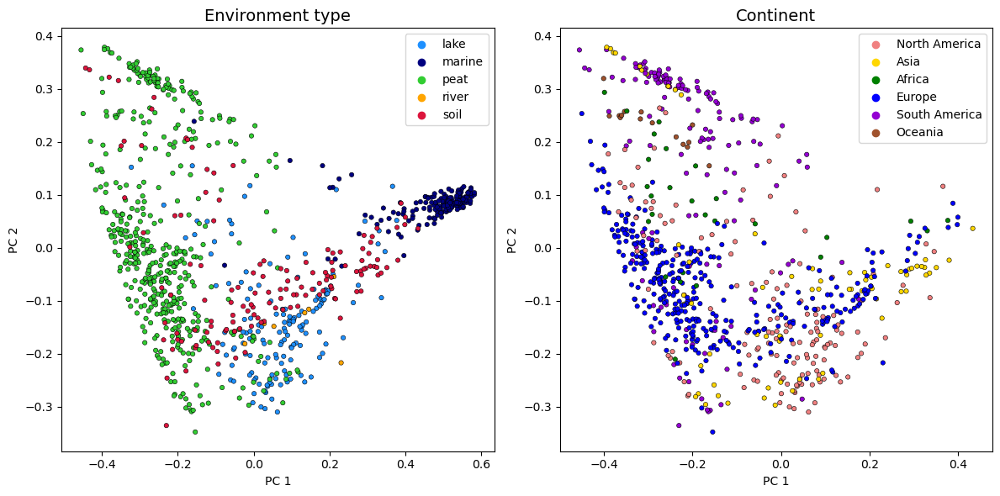

In [16]:
# MS PCA plots
Fig, (ax1, ax2) = plt.subplots(1, 2)
sns.scatterplot(ax= ax1, data=pca2_plot.sort_values(by=['Type']), x='Comp 1', y='Comp 2', hue= 'Type', edgecolor= 'black', s= 15, linewidth= 0.4, palette=sns.color_palette(type_palette, 5))
ax1.set_title("Environment type", fontsize= 14)
ax1.set_xlabel('PC 1')
ax1.set_ylabel('PC 2')
ax1.legend_.set_title(None)
sns.scatterplot(ax= ax2, data=pca2_plot, x='Comp 1', y='Comp 2', hue= 'Continent', edgecolor= 'black', s= 15, linewidth= 0.4, palette= sns.color_palette(cont_palette,6))
ax2.set_title("Continent", fontsize= 14)
ax2.set_xlabel('PC 1')
ax2.set_ylabel('PC 2')
ax2.legend_.set_title(None)
# sns.scatterplot(ax= ax3, data=pca2_plot, x='Comp 1', y='Comp 2', hue= 'Lat', edgecolor= 'black', s= 15, linewidth= 0.4, palette= 'viridis')
# ax3.set_title("Latitude (\u00b0)", fontsize= 14)
# ax3.set_xlabel('')
# ax3.legend_.set_title(None)
# sns.scatterplot(ax= ax4, data=pca2_plot, x='Comp 1', y='Comp 2', hue= 'MAT', edgecolor= 'black', s= 15, linewidth= 0.4, palette= 'inferno_r')
# ax4.set_title("Temperature (\u00b0C)", fontsize= 14)
# ax4.set_xlabel('')
# ax4.set_ylabel('')
# ax4.legend_.set_title(None)
# sns.scatterplot(ax= ax5, data=pca2_plot, x='Comp 1', y='Comp 2', hue= 'IR', edgecolor= 'black', s= 15, linewidth= 0.4)
# ax5.set_title("IR (isomer ratio index)", fontsize= 14)
# ax5.legend_.set_title(None)
# sns.scatterplot(ax= ax6, data=pca2_plot, x='Comp 1', y='Comp 2', hue= 'fC', edgecolor= 'black', s= 15, linewidth= 0.4)
# ax6.set_title("fC (fractional cyclization index)", fontsize= 14)
# ax6.set_ylabel('')
# ax6.legend_.set_title(None)
Fig.set_figheight(6)
Fig.set_figwidth(12)
Fig.tight_layout()
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/4. Martinez-Sosa PCA.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

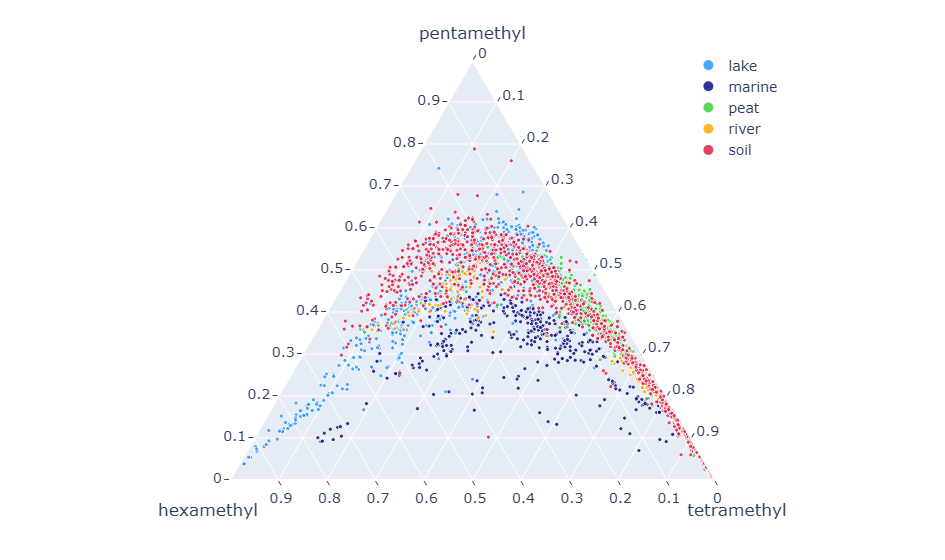

In [17]:
# Ra ternary diagram. Note: Ternary diagrams only utilize brGDGT data and shows the percentages of brGDGTs containing 4, 5, and 6 methyl groups on each of the three axes (tetra-, penta-, and hexamethyl respectively).
ticks= [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
Fig= px.scatter_ternary(data1.sort_values(by=['Type']), a='Penta', b='Hexa', c='Tetra', color= 'Type', size= [1]*len(data1.index), size_max= 3, width=700, height= 560, opacity= 0.8, color_discrete_map = {'lake':'dodgerblue', 'marine':'navy', 'peat':'limegreen', 'river':'orange', 'soil':'crimson'})
Fig.update_layout(font_size= 14)
Fig.update_layout(legend= dict(yanchor="top", y=1.025, x=0.775), legend_title= None)
Fig.update_layout({
        'ternary':
            {
            'aaxis':{'title':'pentamethyl', 'linewidth':2, 'ticks':'outside',
                     'tickvals':ticks},
            'baxis':{'title': 'hexamethyl', 'linewidth':2, 'ticks':'outside',
                     'tickvals':ticks},
            'caxis':{'title': 'tetramethyl', 'linewidth':2, 'ticks':'outside',
                     'tickvals':ticks}}})
Fig.show()

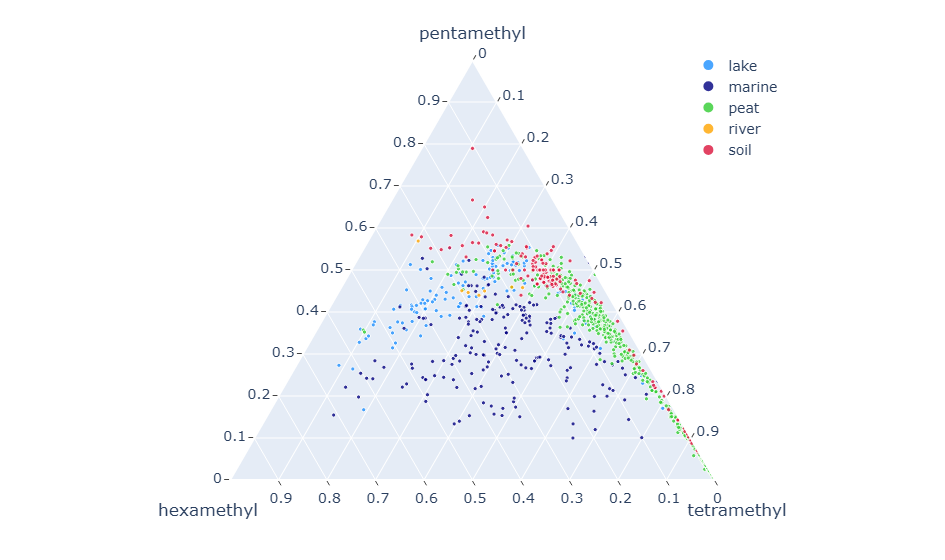

In [18]:
# MS ternary diagram
ticks= [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
Fig= px.scatter_ternary(data2.sort_values(by=['Type']), a='Penta', b='Hexa', c='Tetra', color= 'Type', size= [1]*len(data2.index), size_max= 3, width=700, height= 560, opacity= 0.8, color_discrete_map = {'lake':'dodgerblue', 'marine':'navy', 'peat':'limegreen', 'river':'orange', 'soil':'crimson'})
Fig.update_layout(font_size= 14)
Fig.update_layout(legend= dict(yanchor="top", y=1.025, x=0.775), legend_title= None)
Fig.update_layout({
        'ternary':
            {
            'aaxis':{'title':'pentamethyl', 'linewidth':2, 'ticks':'outside',
                     'tickvals':ticks},
            'baxis':{'title': 'hexamethyl', 'linewidth':2, 'ticks':'outside',
                     'tickvals':ticks},
            'caxis':{'title': 'tetramethyl', 'linewidth':2, 'ticks':'outside',
                     'tickvals':ticks}}})
Fig.show()

In [19]:
# Convert Ra from wide to long format for making GDGT distribution bar plots.
data1_melt= pd.melt(data1, id_vars=['Index', 'Sample_ID', 'Type', 'Site', 'Country', 'Continent', 'Lat', 'Lon', 'Elev', 'Temp', 'MAF', 'WMT', 'MAT', 'pH', 'MBT', 'CBT', 'IR', 'fC', 'DC', 'Tetra', 'Penta', 'Hexa', 'Reference'], value_vars=['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`'])
data1_melt['variable'] = pd.Categorical(data1_melt['variable'], ['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`'])

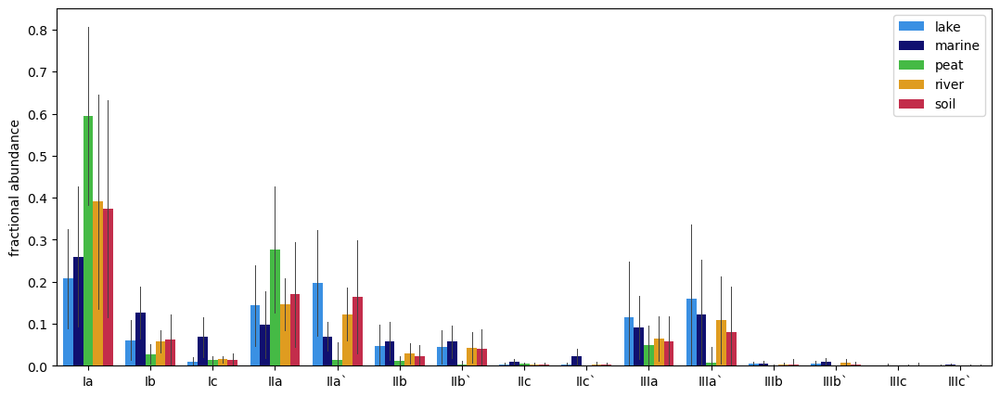

In [20]:
# Ra distribution bar plots. Note: Bar plots are the most straight forward way to display differences in the proportions of individual GDGT compounds between different environment types.
Fig = plt.figure(figsize=(13, 5))
sns.barplot(data=data1_melt.sort_values(by= ['Type']), x="variable", y="value", hue="Type", errorbar="sd", palette= sns.color_palette(type_palette, 5), errwidth=0.7, width=0.8)
plt.ylim(0,0.85)
plt.xlabel("")
plt.ylabel("fractional abundance")
plt.legend(title= "")
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/1. Raberg barplot.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

In [21]:
# Convert MS from wide to long format for making GDGT distribution bar plots.
data2br_melt= pd.melt(data2, id_vars=['Index', 'Sample_ID', 'Type', 'Site', 'Country', 'Continent', 'Lat', 'Lon', 'Elev', 'WMT', 'MAT', 'pH', 'BIT', 'MBT', 'CBT', 'IR', 'fC', 'DC', 'R_i/b', 'Tetra', 'Penta', 'Hexa', 'Reference'], value_vars=['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`'])
data2br_melt['variable'] = pd.Categorical(data2br_melt['variable'], ['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`'])

data2iso_melt= pd.melt(data2, id_vars=['Index', 'Sample_ID', 'Type', 'Site', 'Country', 'Continent', 'Lat', 'Lon', 'Elev', 'WMT', 'MAT', 'pH', 'BIT', 'MBT', 'CBT', 'IR', 'fC', 'DC', 'R_i/b', 'Tetra', 'Penta', 'Hexa', 'Reference'], value_vars=['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`']).sort_values(by= ['variable'])
data2iso_melt['variable'] = pd.Categorical(data2iso_melt['variable'], ['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`'])

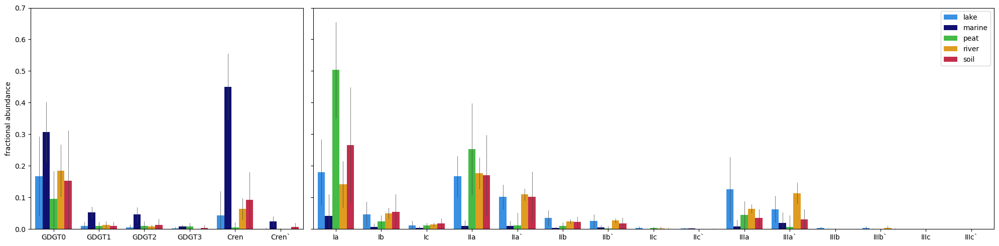

In [22]:
# MS distribution bar plot. Because MS contains all 21 GDGTs (6 isoGDGTs and 15 brGDGTs), the two GDGT classes are grouped together into separate plots. Note that all 21 compounds sum to one.
Fig = plt.figure(figsize=(20, 5)) 
gs = gridspec.GridSpec(1, 2, width_ratios=[1,2.5]) 

ax1 = plt.subplot(gs[0])
sns.barplot(data=data2iso_melt.sort_values(by= ['Type']), x="variable", y="value", hue="Type", errorbar="sd", palette= sns.color_palette(type_palette, 5), errwidth=0.5, width= 0.8, ax= ax1)
ax1.set_ylim(0, 0.7)
ax1.set_xlabel("")
ax1.set_ylabel("fractional abundance")
ax1.get_legend().remove()

ax2 = plt.subplot(gs[1])
sns.barplot(data=data2br_melt.sort_values(by= ['Type']), x="variable", y="value", hue="Type", errorbar="sd", palette= sns.color_palette(type_palette, 5), errwidth=0.5, width= 0.8, ax= ax2)
ax2.set_ylim(0, 0.7)
ax2.set_yticklabels([])
ax2.set_xlabel("")
ax2.set_ylabel("")
ax2.legend(title= "")

Fig.tight_layout()
Fig.set_figwidth(20)
Fig.set_figheight(5)
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/2. Martinez-Sosa barplot.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

In [23]:
###
### Models for Ra
###

In [24]:
# Turn Ra to numpy and split 75:10:15 into training:validation:training sets
X_Ra1 = data1.loc[:,['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']].to_numpy()
y_Ra1 = data1.loc[:,['Type']].to_numpy()

X_Ra2 = data1[data1['Continent'].notna()].loc[:,['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']].to_numpy()
y_Ra2 = data1[data1['Continent'].notna()].loc[:,['Continent']].to_numpy()

X_Ra3 = data1.loc[:,['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']].to_numpy()
y_Ra3 = data1.loc[:,['Lat']].to_numpy()

X_Ra1tr, X , y_Ra1tr, y = tts(X_Ra1, y_Ra1, test_size= 0.25) 
X_Ra1va, X_Ra1te, y_Ra1va, y_Ra1te = tts(X, y, test_size= 0.6)

X_Ra2tr, X , y_Ra2tr, y = tts(X_Ra2, y_Ra2, test_size= 0.25) 
X_Ra2va, X_Ra2te, y_Ra2va, y_Ra2te = tts(X, y, test_size= 0.6)

X_Ra3tr, X , y_Ra3tr, y = tts(X_Ra3, y_Ra3, test_size= 0.25) 
X_Ra3va, X_Ra3te, y_Ra3va, y_Ra3te = tts(X, y, test_size= 0.6)

In [25]:
# Ra Ridge classifier for environment type
RC_Ra1 = RidgeClassifier(alpha=0.5)
RC_Ra1.fit(X_Ra1tr,y_Ra1tr.ravel())
print(RC_Ra1.score(X_Ra1tr,y_Ra1tr))
print(RC_Ra1.score(X_Ra1va,y_Ra1va))
print(RC_Ra1.score(X_Ra1te,y_Ra1te))

0.6524919981710106
0.6541095890410958
0.6757990867579908


In [26]:
# Ra Ridge classifier for continent
RC_Ra2 = RidgeClassifier(alpha=0.4)
RC_Ra2.fit(X_Ra2tr,y_Ra2tr.ravel())
print(RC_Ra2.score(X_Ra2tr,y_Ra2tr))
print(RC_Ra2.score(X_Ra2va,y_Ra2va))
print(RC_Ra2.score(X_Ra2te,y_Ra2te))

0.5422953818015547
0.4657534246575342
0.5776255707762558


In [27]:
# Ra Ridge regression for latitude
RC_Ra3 = Ridge(alpha=0.2)
RC_Ra3.fit(X_Ra3tr,y_Ra3tr.ravel())
print(RC_Ra3.score(X_Ra3tr,y_Ra3tr))
print(RC_Ra3.score(X_Ra3va,y_Ra3va))
print(RC_Ra3.score(X_Ra3te,y_Ra3te))

0.3568120613119391
0.2902305568411333
0.22829781271098948


In [28]:
# Ra random forest for environment type
RF_Ra1 = RandomForestClassifier(n_estimators= 50, max_depth= 20)
RF_Ra1.fit(X_Ra1tr,y_Ra1tr.ravel())
print(RF_Ra1.score(X_Ra1tr,y_Ra1tr))
print(RF_Ra1.score(X_Ra1va,y_Ra1va))
print(RF_Ra1.score(X_Ra1te,y_Ra1te))

0.9995427526291724
0.863013698630137
0.9223744292237442


In [29]:
# Ra random forest for continent
RF_Ra2 = RandomForestClassifier(n_estimators= 30, max_depth= 40)
RF_Ra2.fit(X_Ra2tr,y_Ra2tr.ravel())
print(RF_Ra2.score(X_Ra2tr,y_Ra2tr))
print(RF_Ra2.score(X_Ra2va,y_Ra2va))
print(RF_Ra2.score(X_Ra2te,y_Ra2te))

0.9995427526291724
0.797945205479452
0.7990867579908676


In [30]:
# Ra random forest for latitude
RF_Ra3 = RandomForestRegressor(n_estimators= 30, max_depth= 30)
RF_Ra3.fit(X_Ra3tr,y_Ra3tr.ravel())
print(RF_Ra3.score(X_Ra3tr,y_Ra3tr))
print(RF_Ra3.score(X_Ra3va,y_Ra3va))
print(RF_Ra3.score(X_Ra3te,y_Ra3te))

0.9487641822316456
0.5757737349512877
0.5485053567070672


In [31]:
# For gradient boost, preprocess y datasets for classification.
le = LabelEncoder()
y_Ra1tr_BR = le.fit_transform(y_Ra1tr.ravel())
y_Ra1va_BR = le.fit_transform(y_Ra1va.ravel())
y_Ra1te_BR = le.fit_transform(y_Ra1te.ravel())
y_Ra2tr_BR = le.fit_transform(y_Ra2tr.ravel())
y_Ra2va_BR = le.fit_transform(y_Ra2va.ravel())
y_Ra2te_BR = le.fit_transform(y_Ra2te.ravel())
y_Ra3tr_BR = le.fit_transform(y_Ra3tr.ravel())
y_Ra3va_BR = le.fit_transform(y_Ra3va.ravel())
y_Ra3te_BR = le.fit_transform(y_Ra3te.ravel())

In [32]:
# Ra gradient boost classification tree for environment type
BR_Ra1 = XGBClassifier(n_estimators= 30, learning_rate=0.5, early_stopping_rounds=10)
BR_Ra1.fit(X_Ra1tr, y_Ra1tr_BR, eval_set=[(X_Ra1va, y_Ra1va_BR)], verbose=False)
print(BR_Ra1.score(X_Ra1tr,y_Ra1tr_BR))
print(BR_Ra1.score(X_Ra1va,y_Ra1va_BR))
print(BR_Ra1.score(X_Ra1te,y_Ra1te_BR))

0.9995427526291724
0.8904109589041096
0.8972602739726028


In [33]:
# Ra gradient boost classification tree for continent
BR_Ra2 = XGBClassifier(n_estimators= 20, learning_rate= 0.9, early_stopping_rounds=10)
BR_Ra2.fit(X_Ra2tr, y_Ra2tr_BR, eval_set=[(X_Ra2va, y_Ra2va_BR)], verbose=False)
print(BR_Ra2.score(X_Ra2tr,y_Ra2tr_BR))
print(BR_Ra2.score(X_Ra2va,y_Ra2va_BR))
print(BR_Ra2.score(X_Ra2te,y_Ra2te_BR))

0.9917695473251029
0.7808219178082192
0.7602739726027398


In [34]:
# Ra gradient boost regression tree for latitude
BR_Ra3 = XGBRegressor(n_estimators= 30, learning_rate= 0.3, early_stopping_rounds=10)
BR_Ra3.fit(X_Ra3tr, y_Ra3tr, eval_set=[(X_Ra3va, y_Ra3va)], verbose=False)
print(BR_Ra3.score(X_Ra3tr,y_Ra3tr))
print(BR_Ra3.score(X_Ra3va,y_Ra3va))
print(BR_Ra3.score(X_Ra3te,y_Ra3te))

0.9107828921590961
0.5285552758193719
0.5728482688085628


In [35]:
# Ra summary of scores for each model.
Ra_ls1 = ['ridge','random forest','gradient boost']
Ra_ls2 = [RC_Ra1.score(X_Ra1te,y_Ra1te).round(3),RF_Ra1.score(X_Ra1te,y_Ra1te).round(3),BR_Ra1.score(X_Ra1te,y_Ra1te_BR).round(3)]
Ra_ls3 = [RC_Ra2.score(X_Ra2te,y_Ra2te).round(3),RF_Ra2.score(X_Ra2te,y_Ra2te).round(3),BR_Ra2.score(X_Ra2te,y_Ra2te_BR).round(3)]
Ra_ls4 = [RC_Ra3.score(X_Ra3te,y_Ra3te).round(3),RF_Ra3.score(X_Ra3te,y_Ra3te).round(3),BR_Ra3.score(X_Ra3te,y_Ra3te).round(3)]
Ra_scores = pd.DataFrame(data= {"model":Ra_ls1,"Environment type": Ra_ls2,"Continent": Ra_ls3, "Latitude": Ra_ls4})
Ra_scores

,model,Environment type,Continent,Latitude
0,ridge,0.676,0.578,0.228
1,random forest,0.922,0.799,0.549
2,gradient boost,0.897,0.760,0.573


In [36]:
# Ra summary of F1 scores for each model.
Ra_ls5 = [f1_score(y_Ra1te, RC_Ra1.predict(X_Ra1te), average= 'micro').round(3),f1_score(y_Ra1te, RF_Ra1.predict(X_Ra1te), average= 'micro').round(3),f1_score(y_Ra1te_BR, BR_Ra1.predict(X_Ra1te), average= 'micro').round(3)]
Ra_ls6 = [f1_score(y_Ra2te, RC_Ra2.predict(X_Ra2te), average= 'micro').round(3),f1_score(y_Ra2te, RF_Ra2.predict(X_Ra2te), average= 'micro').round(3),f1_score(y_Ra2te_BR, BR_Ra2.predict(X_Ra2te), average= 'micro').round(3)]
Ra_F1_scores = pd.DataFrame(data= {"model":Ra_ls1,"Environment type F1": Ra_ls5,"Continent F1": Ra_ls6})
Ra_F1_scores

,model,Environment type F1,Continent F1
0,ridge,0.676,0.578
1,random forest,0.922,0.799
2,gradient boost,0.897,0.760


In [37]:
###
### Models for MS
###

In [38]:
# Turn MS to numpy and split 75:10:15 into training:validation:training sets
X_MS1 = data2.loc[:,['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']].to_numpy()
y_MS1 = data2.loc[:,['Type']].to_numpy()

X_MS2 = data2[data2['Continent'].notna()].loc[:,['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']].to_numpy()
y_MS2 = data2[data2['Continent'].notna()].loc[:,['Continent']].to_numpy()

X_MS3 = data2[data2['Lat'].notna()].loc[:,['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']].to_numpy()
y_MS3 = data2[data2['Lat'].notna()].loc[:,['Lat']].to_numpy()

X_MS1tr, X , y_MS1tr, y = tts(X_MS1, y_MS1, test_size= 0.25) 
X_MS1va, X_MS1te, y_MS1va, y_MS1te = tts(X, y, test_size= 0.6)

X_MS2tr, X , y_MS2tr, y = tts(X_MS2, y_MS2, test_size= 0.25) 
X_MS2va, X_MS2te, y_MS2va, y_MS2te = tts(X, y, test_size= 0.6)

X_MS3tr, X , y_MS3tr, y = tts(X_MS3, y_MS3, test_size= 0.25) 
X_MS3va, X_MS3te, y_MS3va, y_MS3te = tts(X, y, test_size= 0.6)

In [39]:
# MS Ridge classifier for environment type 
RC_MS1 = RidgeClassifier(alpha=0.03)
RC_MS1.fit(X_MS1tr,y_MS1tr.ravel())
print(RC_MS1.score(X_MS1tr,y_MS1tr))
print(RC_MS1.score(X_MS1va,y_MS1va))
print(RC_MS1.score(X_MS1te,y_MS1te))

0.8585164835164835
0.8865979381443299
0.8835616438356164


In [40]:
# MS Ridge classifier for continent
RC_MS2 = RidgeClassifier(alpha=0.4)
RC_MS2.fit(X_MS2tr,y_MS2tr.ravel())
print(RC_MS2.score(X_MS2tr,y_MS2tr))
print(RC_MS2.score(X_MS2va,y_MS2va))
print(RC_MS2.score(X_MS2te,y_MS2te))

0.7426597582037997
0.6363636363636364
0.7586206896551724


In [41]:
# MS Ridge classifier for latitude
RC_MS3 = Ridge(alpha=0.01)
RC_MS3.fit(X_MS3tr,y_MS3tr.ravel())
print(RC_MS3.score(X_MS3tr,y_MS3tr))
print(RC_MS3.score(X_MS3va,y_MS3va))
print(RC_MS3.score(X_MS3te,y_MS3te))

0.37793177653469767
0.3324534624854504
0.4229653135884208


In [42]:
# MS random forest for environment type
RF_MS1 = RandomForestClassifier(n_estimators= 30, max_depth= 30)
RF_MS1.fit(X_MS1tr,y_MS1tr.ravel())
print(RF_MS1.score(X_MS1tr,y_MS1tr))
print(RF_MS1.score(X_MS1va,y_MS1va))
print(RF_MS1.score(X_MS1te,y_MS1te))

1.0
0.979381443298969
0.9657534246575342


In [43]:
# MS random forest for continent
RF_MS2 = RandomForestClassifier(n_estimators= 20, max_depth= 40)
RF_MS2.fit(X_MS2tr,y_MS2tr.ravel())
print(RF_MS2.score(X_MS2tr,y_MS2tr))
print(RF_MS2.score(X_MS2va,y_MS2va))
print(RF_MS2.score(X_MS2te,y_MS2te))

0.9965457685664939
0.8051948051948052
0.8793103448275862


In [44]:
# MS random forest for latitude
RF_MS3 = RandomForestRegressor(n_estimators= 20, max_depth= 20)
RF_MS3.fit(X_MS3tr,y_MS3tr.ravel())
print(RF_MS3.score(X_MS3tr,y_MS3tr))
print(RF_MS3.score(X_MS3va,y_MS3va))
print(RF_MS3.score(X_MS3te,y_MS3te))

0.9367582551169237
0.5598862669823104
0.712066571841278


In [45]:
# For gradient boost, preprocess y datasets with categories.
le = LabelEncoder()
y_MS1tr_BR = le.fit_transform(y_MS1tr.ravel())
y_MS1va_BR = le.fit_transform(y_MS1va.ravel())
y_MS1te_BR = le.fit_transform(y_MS1te.ravel())
y_MS2tr_BR = le.fit_transform(y_MS2tr.ravel())
y_MS2va_BR = le.fit_transform(y_MS2va.ravel())
y_MS2te_BR = le.fit_transform(y_MS2te.ravel())

In [46]:
# MS gradient boost classification tree for environment type
BR_MS1 = XGBClassifier(n_estimators= 10, learning_rate=0.4, early_stopping_rounds= 10)
BR_MS1.fit(X_MS1tr, y_MS1tr_BR, eval_set=[(X_MS1va, y_MS1va_BR)], verbose=False)
print(BR_MS1.score(X_MS1tr,y_MS1tr_BR))
print(BR_MS1.score(X_MS1va,y_MS1va_BR))
print(BR_MS1.score(X_MS1te,y_MS1te_BR))

1.0
0.9896907216494846
0.958904109589041


In [47]:
# MS gradient boost classification tree for continent
BR_MS2 = XGBClassifier(n_estimators= 10, learning_rate= 0.5, early_stopping_rounds=10)
BR_MS2.fit(X_MS2tr, y_MS2tr_BR, eval_set=[(X_MS2va, y_MS2va_BR)], verbose=False)
print(BR_MS2.score(X_MS2tr,y_MS2tr_BR))
print(BR_MS2.score(X_MS2va,y_MS2va_BR))
print(BR_MS2.score(X_MS2te,y_MS2te_BR))

1.0
0.8181818181818182
0.9051724137931034


In [48]:
# MS gradient boost regression tree for latitude
BR_MS3 = XGBRegressor(n_estimators= 10, learning_rate= 0.3, early_stopping_rounds=10)
BR_MS3.fit(X_MS3tr, y_MS3tr, eval_set=[(X_MS3va, y_MS3va)], verbose=False)
print(BR_MS3.score(X_MS3tr,y_MS3tr))
print(BR_MS3.score(X_MS3va,y_MS3va))
print(BR_MS3.score(X_MS3te,y_MS3te))

0.9329887234471096
0.5877432320993924
0.623166083537956


In [49]:
# MS summary of scores for each model.
MS_ls1 = ['ridge','random forest','gradient boost']
MS_ls2 = [RC_MS1.score(X_MS1te,y_MS1te).round(3),RF_MS1.score(X_MS1te,y_MS1te).round(3),BR_MS1.score(X_MS1te,y_MS1te_BR).round(3)]
MS_ls3 = [RC_MS2.score(X_MS2te,y_MS2te).round(3),RF_MS2.score(X_MS2te,y_MS2te).round(3),BR_MS2.score(X_MS2te,y_MS2te_BR).round(3)]
MS_ls4 = [RC_MS3.score(X_MS3te,y_MS3te).round(3),RF_MS3.score(X_MS3te,y_MS3te).round(3),BR_MS3.score(X_MS3te,y_MS3te).round(3)]
MS_scores = pd.DataFrame(data= {"model":MS_ls1,"Environment type": MS_ls2,"Continent": MS_ls3, "Latitude": MS_ls4})
MS_scores

,model,Environment type,Continent,Latitude
0,ridge,0.884,0.759,0.423
1,random forest,0.966,0.879,0.712
2,gradient boost,0.959,0.905,0.623


In [50]:
# MS summary of F1 scores for each model.
MS_ls5 = [f1_score(y_MS1te, RC_MS1.predict(X_MS1te), average= 'micro').round(3),f1_score(y_MS1te, RF_MS1.predict(X_MS1te), average= 'micro').round(3),f1_score(y_MS1te_BR, BR_MS1.predict(X_MS1te), average= 'micro').round(3)]
MS_ls6 = [f1_score(y_MS2te, RC_MS2.predict(X_MS2te), average= 'micro').round(3),f1_score(y_MS2te, RF_MS2.predict(X_MS2te), average= 'micro').round(3),f1_score(y_MS2te_BR, BR_MS2.predict(X_MS2te), average= 'micro').round(3)]
MS_F1_scores = pd.DataFrame(data= {"model":MS_ls1,"Environment type F1": MS_ls5,"Continent F1": MS_ls6})
MS_F1_scores

,model,Environment type F1,Continent F1
0,ridge,0.884,0.759
1,random forest,0.966,0.879
2,gradient boost,0.959,0.905


In [51]:
# The generated models for the Raberg data compilation (9 total): RC_Ra1, RC_Ra2, RC_Ra3, RF_Ra1, RF_Ra2, RF_Ra3, BR_Ra1, BR_Ra2, BR_Ra3
# The generated models for the Martinez-Sosa data compilation (9 total): RC_MS1, RC_MS2, RC_MS3, RF_MS1, RF_MS2, RF_MS3, BR_MS1, BR_MS2, BR_MS3

In [52]:
###
### Permutation importance for Ra
###

In [53]:
# Ra, ridge models: single-pass permutation importance
PI_Ra1 = permutation_importance(RC_Ra1, X_Ra1va, y_Ra1va, n_repeats= 10, random_state= 0)
PI_Ra1_df = {'importances':pd.Series(PI_Ra1)['importances_mean'].round(3),'SD':pd.Series(PI_Ra1)['importances_std'].round(3),'variables':['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_Ra1_df = pd.DataFrame(PI_Ra1_df).sort_values(by= 'importances', ascending= False)

PI_Ra2 = permutation_importance(RC_Ra2, X_Ra2va, y_Ra2va, n_repeats= 10, random_state= 0)
PI_Ra2_df = {'importances':pd.Series(PI_Ra2)['importances_mean'].round(3),'SD':pd.Series(PI_Ra2)['importances_std'].round(3),'variables':['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_Ra2_df = pd.DataFrame(PI_Ra2_df).sort_values(by= 'importances', ascending= False)

PI_Ra3 = permutation_importance(RC_Ra3, X_Ra3va, y_Ra3va, n_repeats= 10, random_state= 0)
PI_Ra3_df = {'importances':pd.Series(PI_Ra3)['importances_mean'].round(3),'SD':pd.Series(PI_Ra3)['importances_std'].round(3),'variables':['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_Ra3_df = pd.DataFrame(PI_Ra3_df).sort_values(by= 'importances', ascending= False)

# display(PI_Ra1_df, PI_Ra2_df, PI_Ra3_df)

In [54]:
# Ra, random forest models: single-pass permutation importance
PI_Ra4 = permutation_importance(RF_Ra1, X_Ra1va, y_Ra1va, n_repeats= 10, random_state= 0)
PI_Ra4_df = {'importances':pd.Series(PI_Ra4)['importances_mean'].round(3),'SD':pd.Series(PI_Ra4)['importances_std'].round(3),'variables':['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_Ra4_df = pd.DataFrame(PI_Ra4_df).sort_values(by= 'importances', ascending= False)

PI_Ra5 = permutation_importance(RF_Ra2, X_Ra2va, y_Ra2va, n_repeats= 10, random_state= 0)
PI_Ra5_df = {'importances':pd.Series(PI_Ra5)['importances_mean'].round(3),'SD':pd.Series(PI_Ra5)['importances_std'].round(3),'variables':['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_Ra5_df = pd.DataFrame(PI_Ra5_df).sort_values(by= 'importances', ascending= False)

PI_Ra6 = permutation_importance(RF_Ra3, X_Ra3va, y_Ra3va, n_repeats= 10, random_state= 0)
PI_Ra6_df = {'importances':pd.Series(PI_Ra6)['importances_mean'].round(3),'SD':pd.Series(PI_Ra6)['importances_std'].round(3),'variables':['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_Ra6_df = pd.DataFrame(PI_Ra6_df).sort_values(by= 'importances', ascending= False)

# display(PI_Ra4_df, PI_Ra5_df, PI_Ra6_df)

In [55]:
# Ra, gradient boost tree models: single-pass permutation importance
PI_Ra7 = permutation_importance(BR_Ra1, X_Ra1va, y_Ra1va_BR, n_repeats= 10, random_state= 0)
PI_Ra7_df = {'importances':pd.Series(PI_Ra7)['importances_mean'].round(3),'SD':pd.Series(PI_Ra7)['importances_std'].round(3),'variables':['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_Ra7_df = pd.DataFrame(PI_Ra7_df).sort_values(by= 'importances', ascending= False)

PI_Ra8 = permutation_importance(BR_Ra2, X_Ra2va, y_Ra2va_BR, n_repeats= 10, random_state= 0)
PI_Ra8_df = {'importances':pd.Series(PI_Ra8)['importances_mean'].round(3),'SD':pd.Series(PI_Ra8)['importances_std'].round(3),'variables':['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_Ra8_df = pd.DataFrame(PI_Ra8_df).sort_values(by= 'importances', ascending= False)

PI_Ra9 = permutation_importance(BR_Ra3, X_Ra3va, y_Ra3va, n_repeats= 10, random_state= 0)
PI_Ra9_df = {'importances':pd.Series(PI_Ra9)['importances_mean'].round(3),'SD':pd.Series(PI_Ra9)['importances_std'].round(3),'variables':['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_Ra9_df = pd.DataFrame(PI_Ra9_df).sort_values(by= 'importances', ascending= False)

# display(PI_Ra7_df, PI_Ra8_df, PI_Ra9_df)

In [56]:
# Ra: Merge the 3 ridge/forest/gradient boost model permutation importance dataframes
PI_Ra13_merge = PI_Ra1_df.merge(PI_Ra2_df, on= ['variables'], suffixes= ('_ridge','_forest'))
PI_Ra13_merge = PI_Ra13_merge.merge(PI_Ra3_df, on= ['variables']) # No suffix on gradient boost tree

PI_Ra46_merge = PI_Ra4_df.merge(PI_Ra5_df, on= ['variables'], suffixes= ('_ridge','_forest'))
PI_Ra46_merge = PI_Ra46_merge.merge(PI_Ra6_df, on= ['variables']) # No suffix on gradient boost tree

PI_Ra79_merge = PI_Ra7_df.merge(PI_Ra8_df, on= ['variables'], suffixes= ('_ridge','_forest'))
PI_Ra79_merge = PI_Ra79_merge.merge(PI_Ra9_df, on= ['variables']) # No suffix on gradient boost tree

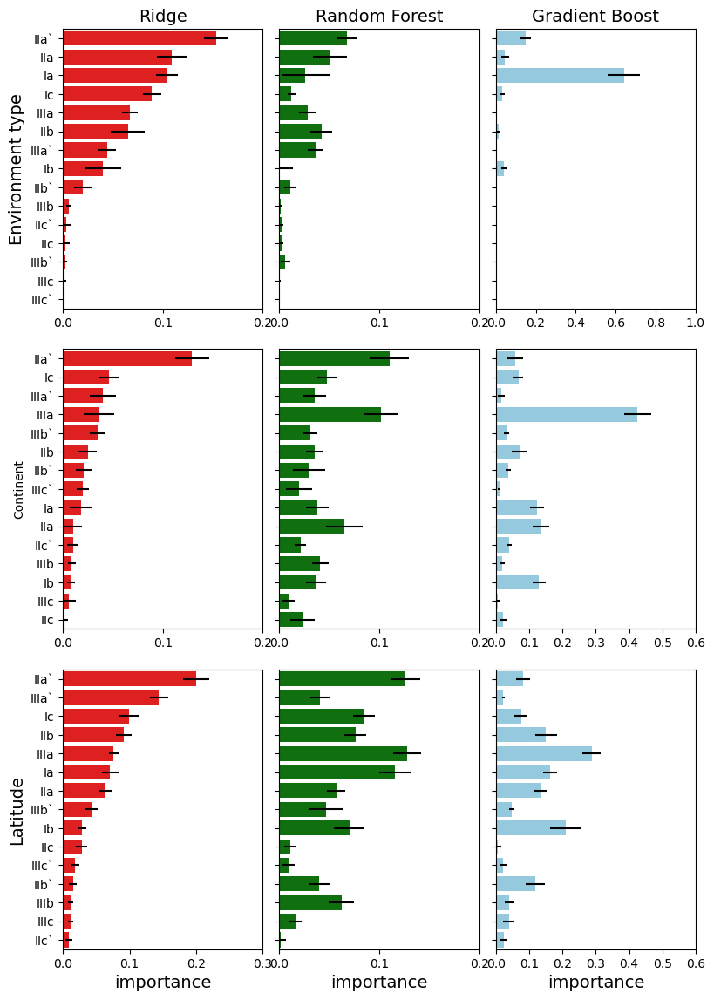

In [57]:
# Plot the permutation importance graphs for all 9 Ra models. For each variable, the y-axis order of GDGTs are held constant.
Fig, ((ax1,ax2,ax3),(ax4,ax5,ax6),(ax7,ax8,ax9)) = plt.subplots(3, 3)
sns.barplot(ax= ax1, data= PI_Ra13_merge, x= 'importances_ridge', y= 'variables', color= 'red', xerr=PI_Ra13_merge['SD_ridge'])
# .sort_values(by= ['variables'], ascending= False)
ax1.set_xticks(np.arange(0,1,0.1)) 
ax1.set_xlim(0,0.2)
ax1.set_xlabel("")
ax1.set_ylabel("Environment type", fontsize= 14)
ax1.set_title("Ridge", fontsize= 14)
sns.barplot(ax= ax2, data= PI_Ra13_merge, x= 'importances_forest', y= 'variables', color= 'green', xerr=PI_Ra13_merge['SD_forest'])
ax2.set_xticks(np.arange(0,1,0.1)) 
ax2.set_xlim(0,0.2)
ax2.set_yticklabels([])
ax2.set_xlabel("")
ax2.set_ylabel("")
ax2.set_title("Random Forest", fontsize= 14)
sns.barplot(ax= ax3, data= PI_Ra13_merge, x= 'importances', y= 'variables',  color= 'skyblue', xerr=PI_Ra13_merge['SD'])
ax3.set_xticks(np.arange(0,1.2,0.2))
ax3.set_xlim(0,1)
ax3.set_yticklabels([])
ax3.set_xlabel("")
ax3.set_ylabel("")
ax3.set_title("Gradient Boost", fontsize= 14)

sns.barplot(ax= ax4, data= PI_Ra46_merge, x= 'importances_ridge', y= 'variables', color= 'red', xerr=PI_Ra46_merge['SD_ridge'])
ax4.set_xticks(np.arange(0,1,0.1)) 
ax4.set_xlim(0,0.2)
ax4.set_xlabel("")
ax4.set_ylabel("Continent")
sns.barplot(ax= ax5, data= PI_Ra46_merge, x= 'importances_forest', y= 'variables', color= 'green', xerr=PI_Ra46_merge['SD_forest'])
ax5.set_xticks(np.arange(0,1,0.1)) 
ax5.set_xlim(0,0.2)
ax5.set_yticklabels([])
ax5.set_xlabel("")
ax5.set_ylabel("")
sns.barplot(ax= ax6, data= PI_Ra46_merge, x= 'importances', y= 'variables', color= 'skyblue', xerr=PI_Ra46_merge['SD'])
ax6.set_xticks(np.arange(0,1,0.1)) 
ax6.set_xlim(0,0.6)
ax6.set_yticklabels([])
ax6.set_xlabel("")
ax6.set_ylabel("")

sns.barplot(ax= ax7, data= PI_Ra79_merge, x= 'importances_ridge', y= 'variables', color= 'red', xerr=PI_Ra79_merge['SD_ridge'])
ax7.set_xticks(np.arange(0,1,0.1)) 
ax7.set_xlim(0,0.3)
ax7.set_xlabel("importance", fontsize= 14)
ax7.set_ylabel("Latitude", fontsize= 14)
sns.barplot(ax= ax8, data= PI_Ra79_merge, x= 'importances_forest', y= 'variables', color= 'green', xerr=PI_Ra79_merge['SD_forest'])
ax8.set_xticks(np.arange(0,1,0.1)) 
ax8.set_xlim(0,0.2)
ax8.set_yticklabels([])
ax8.set_xlabel("importance", fontsize= 14)
ax8.set_ylabel("")
sns.barplot(ax= ax9, data= PI_Ra79_merge, x= 'importances', y= 'variables', color= 'skyblue', xerr=PI_Ra79_merge['SD'])
ax9.set_xticks(np.arange(0,1,0.1)) 
ax9.set_xlim(0,0.6)
ax9.set_yticklabels([])
ax9.set_xlabel("importance", fontsize= 14)
ax9.set_ylabel("")

Fig.tight_layout(pad= -0.5)
Fig.set_figheight(12)
Fig.set_figwidth(8)
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/5. Raberg models, permutation importance.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

In [58]:
###
### Permutation importance for Martinez-Sosa
###

In [59]:
# MS, ridge models: single-pass permutation importance
PI_MS1 = permutation_importance(RC_MS1, X_MS1va, y_MS1va, n_repeats= 10, random_state= 0)
PI_MS1_df = {'importances':pd.Series(PI_MS1)['importances_mean'].round(3),'SD':pd.Series(PI_MS1)['importances_std'].round(3),'variables':['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_MS1_df = pd.DataFrame(PI_MS1_df).sort_values(by= 'importances', ascending= False)

PI_MS2 = permutation_importance(RC_MS2, X_MS2va, y_MS2va, n_repeats= 10, random_state= 0)
PI_MS2_df = {'importances':pd.Series(PI_MS2)['importances_mean'].round(3),'SD':pd.Series(PI_MS2)['importances_std'].round(3),'variables':['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_MS2_df = pd.DataFrame(PI_MS2_df).sort_values(by= 'importances', ascending= False)

PI_MS3 = permutation_importance(RC_MS3, X_MS3va, y_MS3va, n_repeats= 10, random_state= 0)
PI_MS3_df = {'importances':pd.Series(PI_MS3)['importances_mean'].round(3),'SD':pd.Series(PI_MS3)['importances_std'].round(3),'variables':['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_MS3_df = pd.DataFrame(PI_MS3_df).sort_values(by= 'importances', ascending= False)

# display(PI_MS1_df, PI_MS2_df, PI_MS3_df)

In [60]:
# MS, random forest models: single-pass permutation importance
PI_MS4 = permutation_importance(RF_MS1, X_MS1va, y_MS1va, n_repeats= 10, random_state= 0)
PI_MS4_df = {'importances':pd.Series(PI_MS4)['importances_mean'].round(3),'SD':pd.Series(PI_MS4)['importances_std'].round(3),'variables':['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_MS4_df = pd.DataFrame(PI_MS4_df).sort_values(by= 'importances', ascending= False)

PI_MS5 = permutation_importance(RF_MS2, X_MS2va, y_MS2va, n_repeats= 10, random_state= 0)
PI_MS5_df = {'importances':pd.Series(PI_MS5)['importances_mean'].round(3),'SD':pd.Series(PI_MS5)['importances_std'].round(3),'variables':['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_MS5_df = pd.DataFrame(PI_MS5_df).sort_values(by= 'importances', ascending= False)

PI_MS6 = permutation_importance(RF_MS3, X_MS3va, y_MS3va, n_repeats= 10, random_state= 0)
PI_MS6_df = {'importances':pd.Series(PI_MS6)['importances_mean'].round(3),'SD':pd.Series(PI_MS6)['importances_std'].round(3),'variables':['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_MS6_df = pd.DataFrame(PI_MS6_df).sort_values(by= 'importances', ascending= False)

# display(PI_MS4_df, PI_MS5_df, PI_MS6_df)

In [61]:
# MS, gradient boost tree models: single-pass permutation importance
PI_MS7 = permutation_importance(BR_MS1, X_MS1va, y_MS1va_BR, n_repeats= 10, random_state= 0)
PI_MS7_df = {'importances':pd.Series(PI_MS7)['importances_mean'].round(3),'SD':pd.Series(PI_MS7)['importances_std'].round(3),'variables':['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_MS7_df = pd.DataFrame(PI_MS7_df).sort_values(by= 'importances', ascending= False)

PI_MS8 = permutation_importance(BR_MS2, X_MS2va, y_MS2va_BR, n_repeats= 10, random_state= 0)
PI_MS8_df = {'importances':pd.Series(PI_MS8)['importances_mean'].round(3),'SD':pd.Series(PI_MS8)['importances_std'].round(3),'variables':['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_MS8_df = pd.DataFrame(PI_MS8_df).sort_values(by= 'importances', ascending= False)

PI_MS9 = permutation_importance(BR_MS3, X_MS3va, y_MS3va, n_repeats= 10, random_state= 0)
PI_MS9_df = {'importances':pd.Series(PI_MS9)['importances_mean'].round(3),'SD':pd.Series(PI_MS9)['importances_std'].round(3),'variables':['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`']}
PI_MS9_df = pd.DataFrame(PI_MS9_df).sort_values(by= 'importances', ascending= False)

# display(PI_MS7_df, PI_MS8_df, PI_MS9_df)

In [62]:
# MS: Merge the 3 ridge/forest/boost model permutation importance dataframes
PI_MS13_merge = PI_MS1_df.merge(PI_MS2_df, on= ['variables'], suffixes= ('_ridge','_forest'))
PI_MS13_merge = PI_MS13_merge.merge(PI_MS3_df, on= ['variables']) # No suffix on gradient boost tree

PI_MS46_merge = PI_MS4_df.merge(PI_MS5_df, on= ['variables'], suffixes= ('_ridge','_forest'))
PI_MS46_merge = PI_MS46_merge.merge(PI_MS6_df, on= ['variables']) # No suffix on gradient boost tree

PI_MS79_merge = PI_MS7_df.merge(PI_MS8_df, on= ['variables'], suffixes= ('_ridge','_forest'))
PI_MS79_merge = PI_MS79_merge.merge(PI_MS9_df, on= ['variables']) # No suffix on gradient boost tree

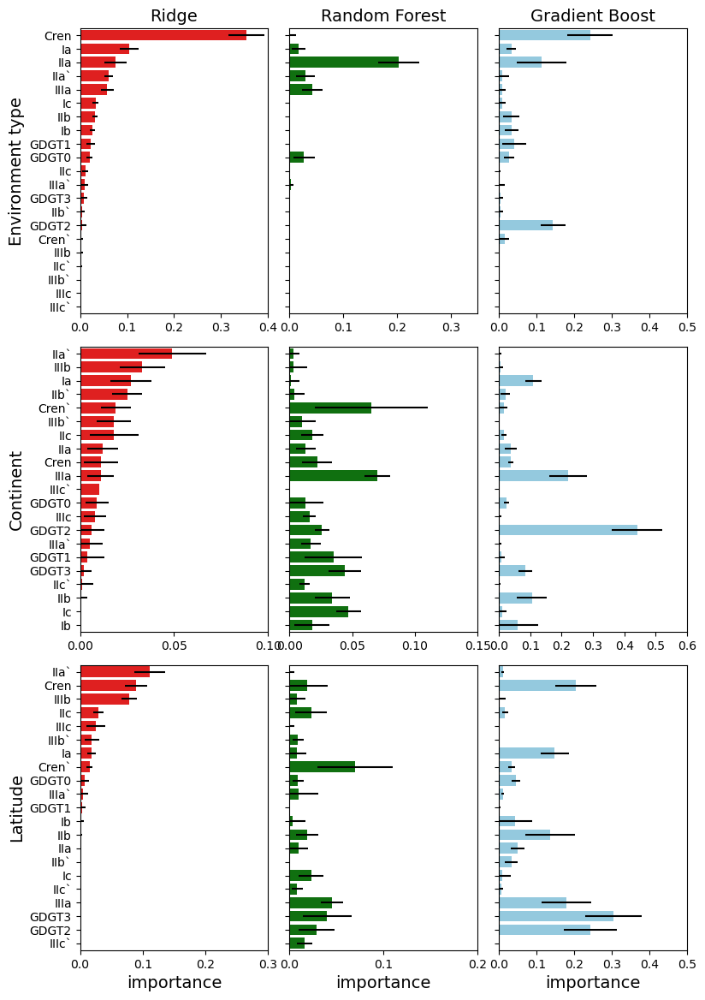

In [63]:
# Plot the permutation importance graphs for all 9 MS models. For each variable, the y-axis order of GDGTs are held constant.
Fig, ((ax1,ax2,ax3),(ax4,ax5,ax6),(ax7,ax8,ax9)) = plt.subplots(3, 3)
sns.barplot(ax= ax1, data= PI_MS13_merge, x= 'importances_ridge', y= 'variables', color= 'red', xerr=PI_MS13_merge['SD_ridge'])
ax1.set_xticks(np.arange(0,1,0.1)) 
ax1.set_xlim(0,0.4)
ax1.set_xlabel("")
ax1.set_ylabel("Environment type", fontsize= 14)
ax1.set_title("Ridge", fontsize= 14)
sns.barplot(ax= ax2, data= PI_MS13_merge, x= 'importances_forest', y= 'variables', color= 'green', xerr=PI_MS13_merge['SD_forest'])
ax2.set_xticks(np.arange(0,1,0.1)) 
ax2.set_xlim(0,0.35)
ax2.set_yticklabels([])
ax2.set_xlabel("")
ax2.set_ylabel("")
ax2.set_title("Random Forest", fontsize= 14)
sns.barplot(ax= ax3, data= PI_MS13_merge, x= 'importances', y= 'variables', color= 'skyblue', xerr=PI_MS13_merge['SD'])
ax3.set_xticks(np.arange(0,1,0.1)) 
ax3.set_xlim(0,0.5)
ax3.set_yticklabels([])
ax3.set_xlabel("")
ax3.set_ylabel("")
ax3.set_title("Gradient Boost", fontsize= 14)

sns.barplot(ax= ax4, data= PI_MS46_merge, x= 'importances_ridge', y= 'variables', color= 'red', xerr=PI_MS46_merge['SD_ridge'])
ax4.set_xticks(np.arange(0,1,0.05)) 
ax4.set_xlim(0,0.1)
ax4.set_xlabel("")
ax4.set_ylabel("Continent", fontsize= 14)
sns.barplot(ax= ax5, data= PI_MS46_merge, x= 'importances_forest', y= 'variables', color= 'green', xerr=PI_MS46_merge['SD_forest'])
ax5.set_xticks(np.arange(0,1,0.05)) 
ax5.set_xlim(0,0.15)
ax5.set_yticklabels([])
ax5.set_xlabel("")
ax5.set_ylabel("")
sns.barplot(ax= ax6, data= PI_MS46_merge, x= 'importances', y= 'variables', color= 'skyblue', xerr=PI_MS46_merge['SD'])
ax6.set_xticks(np.arange(0,1,0.1))
ax6.set_xlim(0,0.6)
ax6.set_yticklabels([])
ax6.set_xlabel("")
ax6.set_ylabel("")

sns.barplot(ax= ax7, data= PI_MS79_merge, x= 'importances_ridge', y= 'variables', color= 'red', xerr=PI_MS79_merge['SD_ridge'])
ax7.set_xticks(np.arange(0,1,0.1)) 
ax7.set_xlim(0,0.3)
ax7.set_xlabel("importance", fontsize= 14)
ax7.set_ylabel("Latitude", fontsize= 14)
sns.barplot(ax= ax8, data= PI_MS79_merge, x= 'importances_forest', y= 'variables', color= 'green', xerr=PI_MS79_merge['SD_forest'])
ax8.set_xticks(np.arange(0,1,0.1)) 
ax8.set_xlim(0,0.2)
ax8.set_yticklabels([])
ax8.set_xlabel("importance", fontsize= 14)
ax8.set_ylabel("")
sns.barplot(ax= ax9, data= PI_MS79_merge, x= 'importances', y= 'variables', color= 'skyblue', xerr=PI_MS79_merge['SD'])
ax9.set_xticks(np.arange(0,1,0.1))
ax9.set_xlim(0,0.5)
ax9.set_yticklabels([])
ax9.set_xlabel("importance", fontsize= 14)
ax9.set_ylabel("")

Fig.tight_layout(pad= -0.8)
Fig.set_figheight(12)
Fig.set_figwidth(8)
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/6. Martinez-Sosa models, permutation importance.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

In [64]:
# Confusion matrices for both Ra and MS

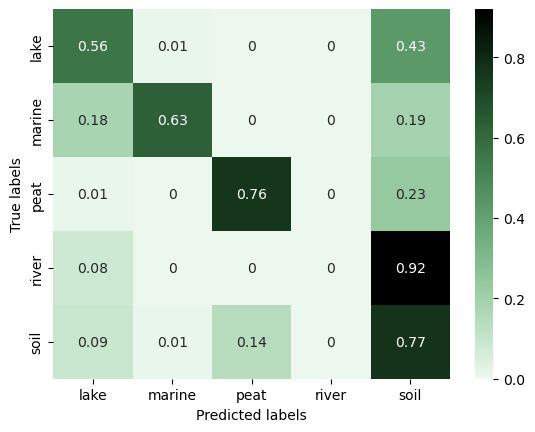

In [137]:
# Confusion matrix for Ra random forest environment type classification. 
Ra_RF_CF = metrics.confusion_matrix(y_Ra1te.ravel(), RC_Ra1.predict(X_Ra1te))
# Ra_RF_CFplot = metrics.ConfusionMatrixDisplay(confusion_matrix = Ra_RF_CF)
# Ra_RF_CFplot.plot()
# plt.show()
Ra_RF_CF_perc = Ra_RF_CF/np.repeat(Ra_RF_CF.astype(np.float64).sum(axis=1).reshape(-1,1), 5, axis=1)
np.nan_to_num(Ra_RF_CF_perc, copy= False, nan= 0.0)
ax= plt.subplot()
sns.heatmap(Ra_RF_CF_perc.round(2), annot=True, fmt='g', ax= ax, cmap= sns.cubehelix_palette(start=2, rot=0, dark=0, light=.95, reverse=False, as_cmap=True))
ax.xaxis.set_ticklabels(['lake','marine','peat','river','soil'])
ax.yaxis.set_ticklabels(['lake','marine','peat','river','soil'])
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/10. Raberg confusion matrix.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

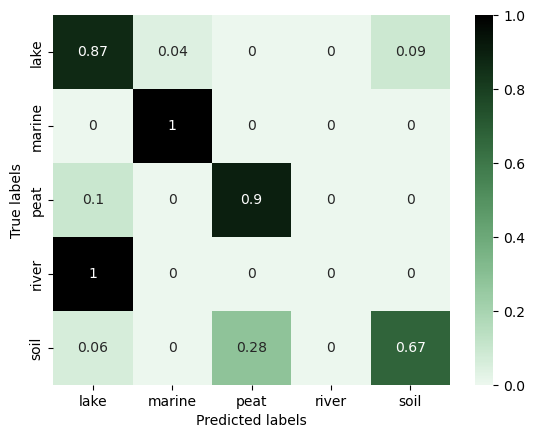

In [138]:
# Confusion matrix for MS random forest environment type classification
MS_RF_CF = metrics.confusion_matrix(y_MS1te.ravel(), RC_MS1.predict(X_MS1te))
# MS_RF_CFplot = metrics.ConfusionMatrixDisplay(confusion_matrix = MS_RF_CF)
# MS_RF_CFplot.plot()
# plt.show()
MS_RF_CF_perc = MS_RF_CF/np.repeat(MS_RF_CF.astype(np.float64).sum(axis=1).reshape(-1,1), 5, axis=1)
np.nan_to_num(MS_RF_CF_perc, copy= False, nan= 0.0)
ax= plt.subplot()
sns.heatmap(MS_RF_CF_perc.round(2), annot=True, fmt='g', ax= ax, cmap= sns.cubehelix_palette(start=2, rot=0, dark=0, light=.95, reverse=False, as_cmap=True))
ax.xaxis.set_ticklabels(['lake','marine','peat','river','soil'])
ax.yaxis.set_ticklabels(['lake','marine','peat','river','soil'])
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/11. Martinez-Sosa confusion matrix.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

In [66]:
###
### SHAP values for Raberg data compilation
###

In [67]:
# Turn numpy test dataset back to dataframe with labeled column headers.
X_Ra1te_df= pd.DataFrame(data= X_Ra1te, columns= ['Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`'])

In [68]:
# SHAP values for random forest classification model of environment type
exp_Ra1 = shap.Explainer(RF_Ra1)
shap_Ra1 = exp_Ra1.shap_values(X_Ra1te_df)

C:\Users\rache\miniconda3\envs\pyleo\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:227: RuntimeWarning:

invalid value encountered in divide



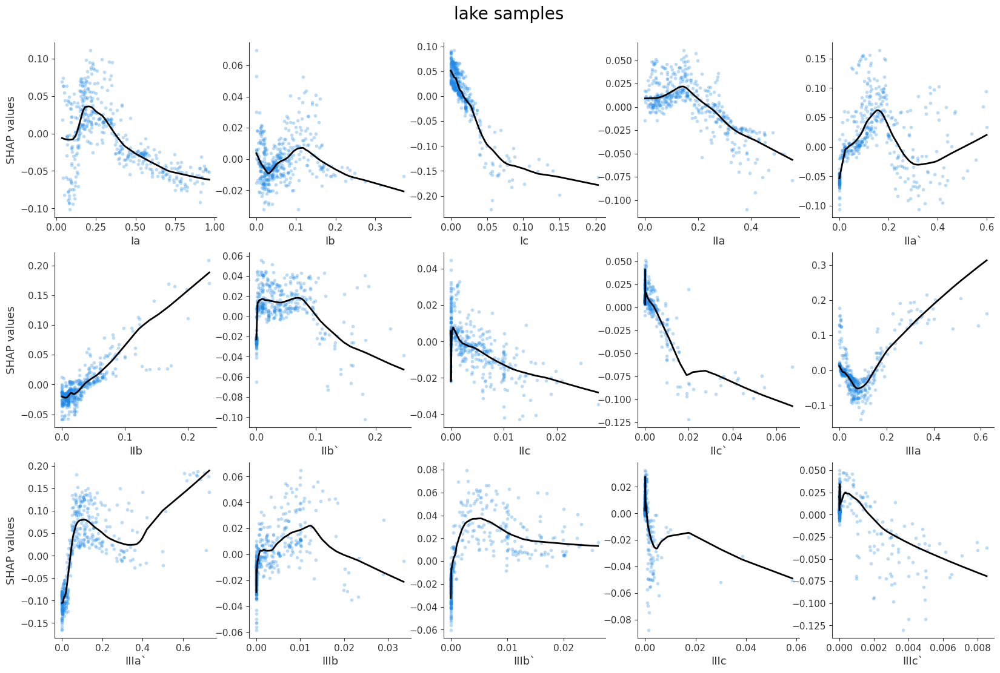

In [69]:
# Subplots of random forest SHAP values plotted against individual GDGTs for lake samples
Fig, ((ax1,ax2,ax3,ax4,ax5),(ax6,ax7,ax8,ax9,ax10),(ax11,ax12,ax13,ax14,ax15)) = plt.subplots(3,5)
shap.dependence_plot("Ia", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ia")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ib")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ic")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIb")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("SHAP values")

shap.dependence_plot("IIb`", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIb`")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("")

shap.dependence_plot("IIc", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIc")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIc`")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIa")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIa`")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("SHAP values")

shap.dependence_plot("IIIb", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIb")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIb`")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("")

shap.dependence_plot("IIIc", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIc")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIc`")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

Fig.suptitle('lake samples', fontsize= 20)
plt.subplots_adjust(top=0.93)
Fig.set_figheight(12)
Fig.set_figwidth(20)
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/7.1 Raberg random forest, lake SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

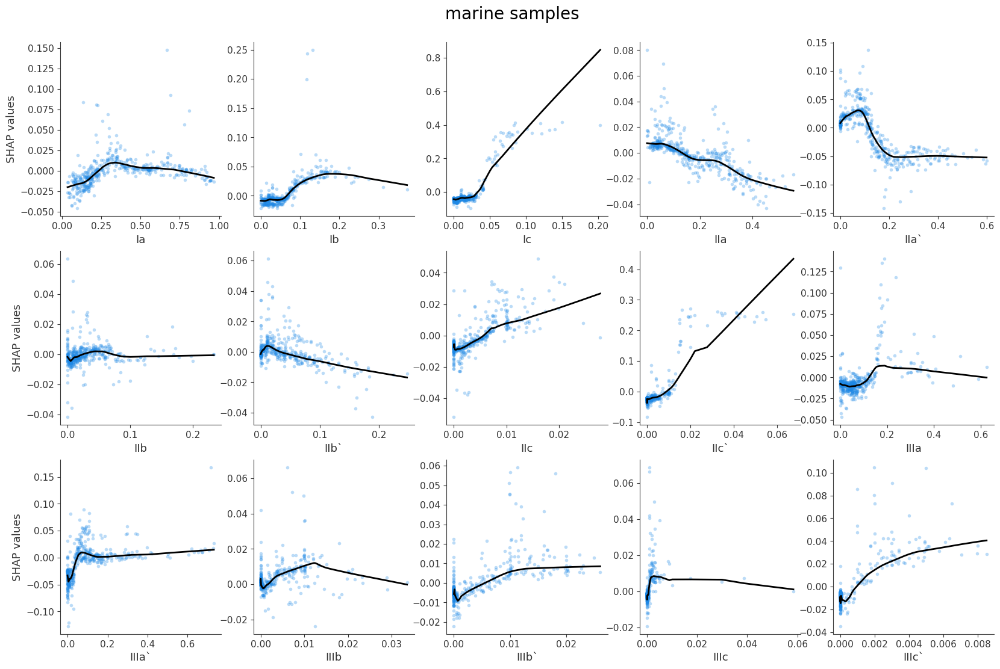

In [70]:
# Subplots of random forest SHAP values plotted against individual GDGTs for marine samples
Fig, ((ax1,ax2,ax3,ax4,ax5),(ax6,ax7,ax8,ax9,ax10),(ax11,ax12,ax13,ax14,ax15)) = plt.subplots(3,5)
shap.dependence_plot("Ia", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ia")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ib")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ic")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIb")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("SHAP values")

shap.dependence_plot("IIb`", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIb`")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("")

shap.dependence_plot("IIc", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIc")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIc`")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIa")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIa`")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("SHAP values")

shap.dependence_plot("IIIb", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIb")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIb`")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("")

shap.dependence_plot("IIIc", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIc")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIc`")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

Fig.suptitle('marine samples', fontsize= 20)
plt.subplots_adjust(top=0.93)
Fig.set_figheight(12)
Fig.set_figwidth(20)
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/7.2 Raberg random forest, marine SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

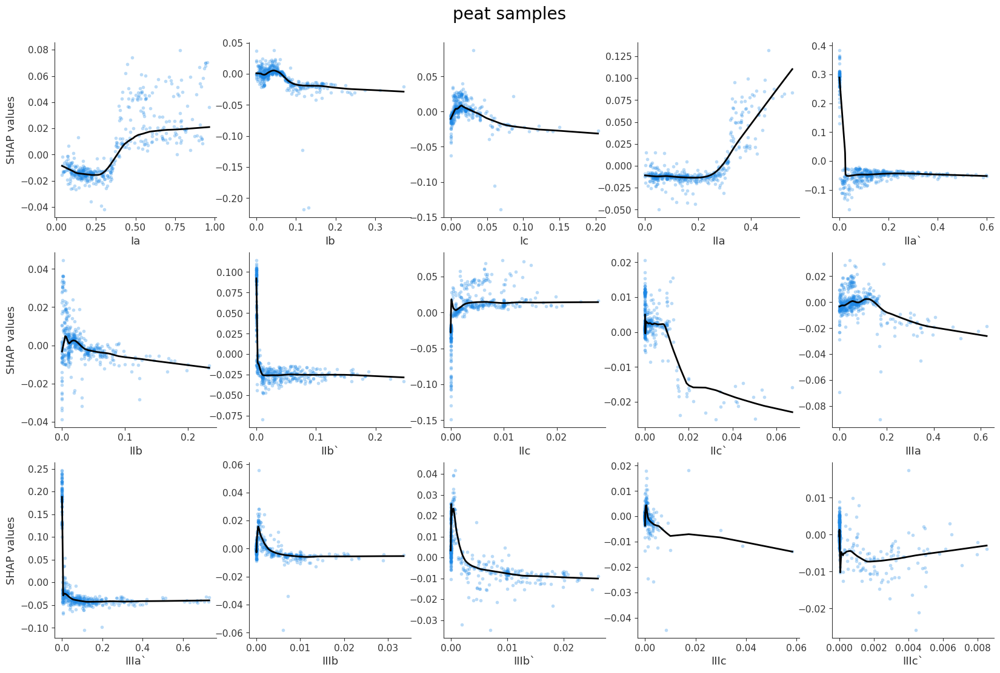

In [71]:
# Subplots of random forest SHAP values plotted against individual GDGTs for peat samples
Fig, ((ax1,ax2,ax3,ax4,ax5),(ax6,ax7,ax8,ax9,ax10),(ax11,ax12,ax13,ax14,ax15)) = plt.subplots(3,5)
shap.dependence_plot("Ia", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ia")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ib")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ic")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIb")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("SHAP values")

shap.dependence_plot("IIb`", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIb`")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("")

shap.dependence_plot("IIc", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIc")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIc`")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIa")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIa`")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("SHAP values")

shap.dependence_plot("IIIb", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIb")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIb`")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("")

shap.dependence_plot("IIIc", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIc")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIc`")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

Fig.suptitle('peat samples', fontsize= 20)
plt.subplots_adjust(top=0.93)
Fig.set_figheight(12)
Fig.set_figwidth(20)
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/7.3 Raberg random forest, peat SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

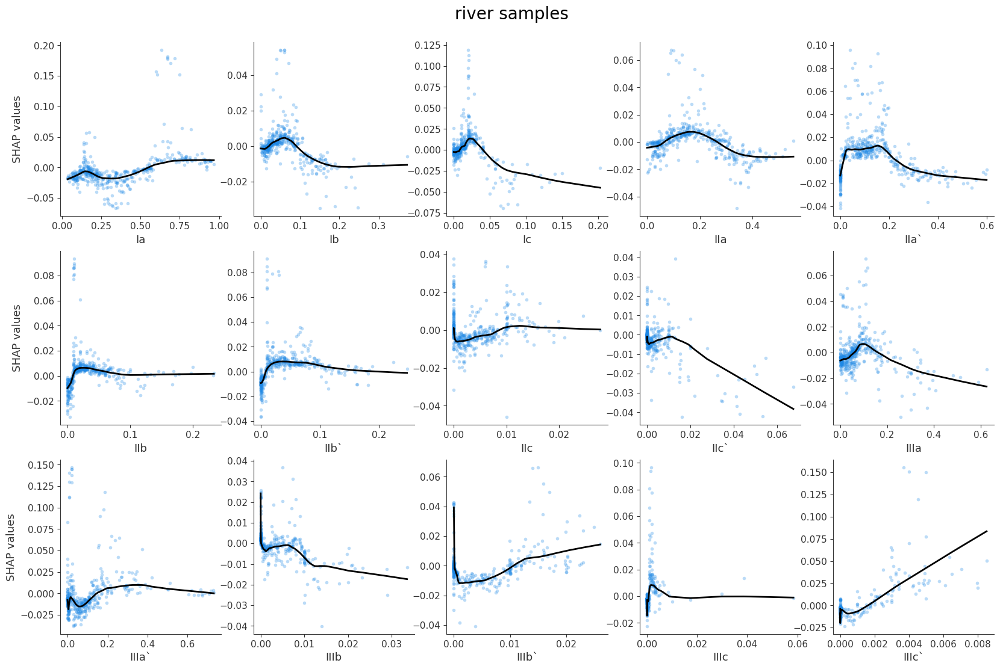

In [72]:
# Subplots of random forest SHAP values plotted against individual GDGTs for river samples
Fig, ((ax1,ax2,ax3,ax4,ax5),(ax6,ax7,ax8,ax9,ax10),(ax11,ax12,ax13,ax14,ax15)) = plt.subplots(3,5)
shap.dependence_plot("Ia", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ia")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ib")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ic")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIb")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("SHAP values")

shap.dependence_plot("IIb`", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIb`")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("")

shap.dependence_plot("IIc", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIc")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIc`")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIa")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIa`")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("SHAP values")

shap.dependence_plot("IIIb", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIb")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIb`")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("")

shap.dependence_plot("IIIc", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIc")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIc`")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

Fig.suptitle('river samples', fontsize= 20)
plt.subplots_adjust(top=0.93)
Fig.set_figheight(12)
Fig.set_figwidth(20)
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/7.4 Raberg random forest, river SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

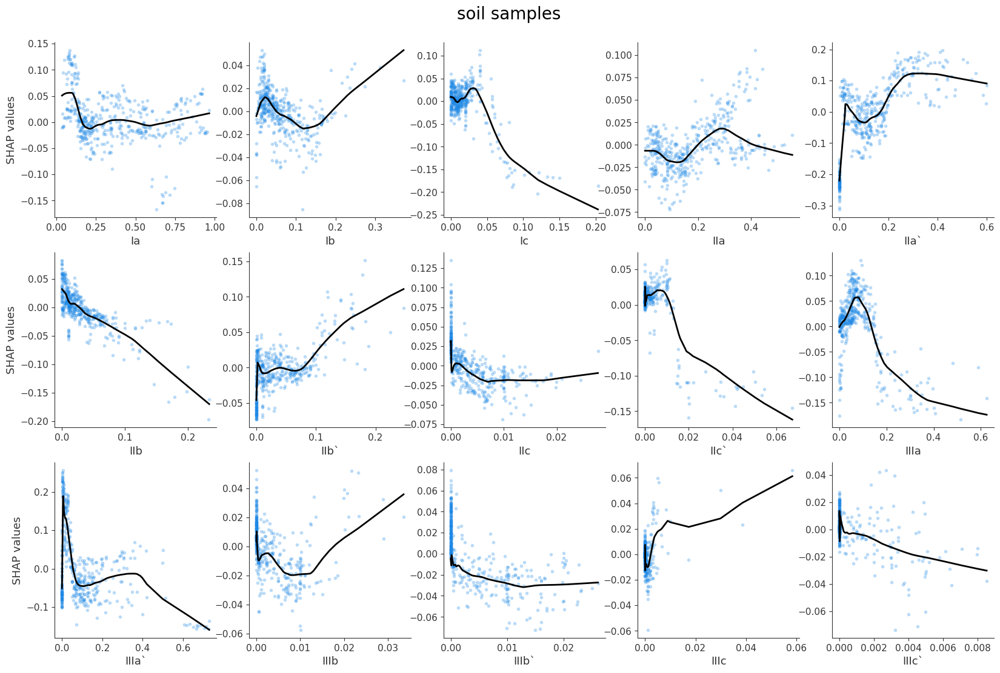

In [73]:
# Subplots of random forest SHAP values plotted against individual GDGTs for soil samples
Fig, ((ax1,ax2,ax3,ax4,ax5),(ax6,ax7,ax8,ax9,ax10),(ax11,ax12,ax13,ax14,ax15)) = plt.subplots(3,5)
shap.dependence_plot("Ia", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ia")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ib")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="Ic")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIb")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("SHAP values")

shap.dependence_plot("IIb`", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIb`")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("")

shap.dependence_plot("IIc", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIc")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIc`")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIa")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIa`")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("SHAP values")

shap.dependence_plot("IIIb", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIb")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIb`")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("")

shap.dependence_plot("IIIc", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIc")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIIc`")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

Fig.suptitle('soil samples', fontsize= 20)
plt.subplots_adjust(top=0.93)
Fig.set_figheight(12)
Fig.set_figwidth(20)
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/7.5 Raberg random forest, soil SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

In [74]:
# SHAP values for gradient boost classification model of environment type
exp_Ra2 = shap.Explainer(BR_Ra1)
shap_Ra2 = exp_Ra2.shap_values(X_Ra1te_df)

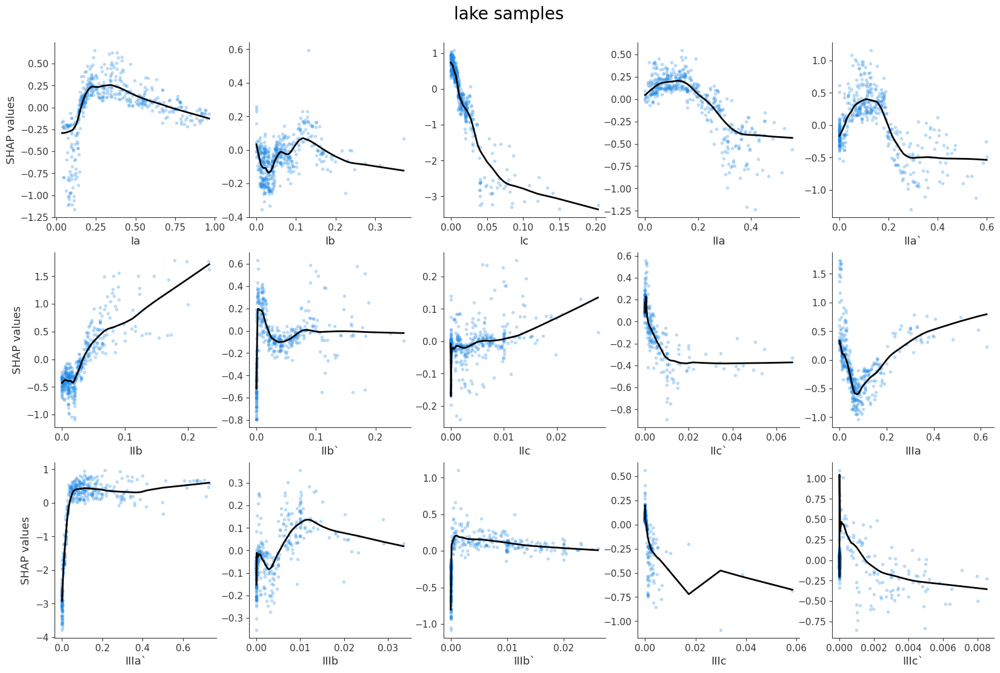

In [75]:
# Subplots of gradient boost SHAP values plotted against individual GDGTs for lake samples
Fig, ((ax1,ax2,ax3,ax4,ax5),(ax6,ax7,ax8,ax9,ax10),(ax11,ax12,ax13,ax14,ax15)) = plt.subplots(3,5)
shap.dependence_plot("Ia", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ia")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ib")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ic")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIb")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("SHAP values")

shap.dependence_plot("IIb`", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIb`")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("")

shap.dependence_plot("IIc", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIc")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIc`")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIa")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIa`")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("SHAP values")

shap.dependence_plot("IIIb", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIb")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIb`")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("")

shap.dependence_plot("IIIc", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIc")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_Ra2[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIc`")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

Fig.suptitle('lake samples', fontsize= 20)
plt.subplots_adjust(top=0.93)
Fig.set_figheight(12)
Fig.set_figwidth(20)
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/8.1 Raberg gradient boost, lake SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

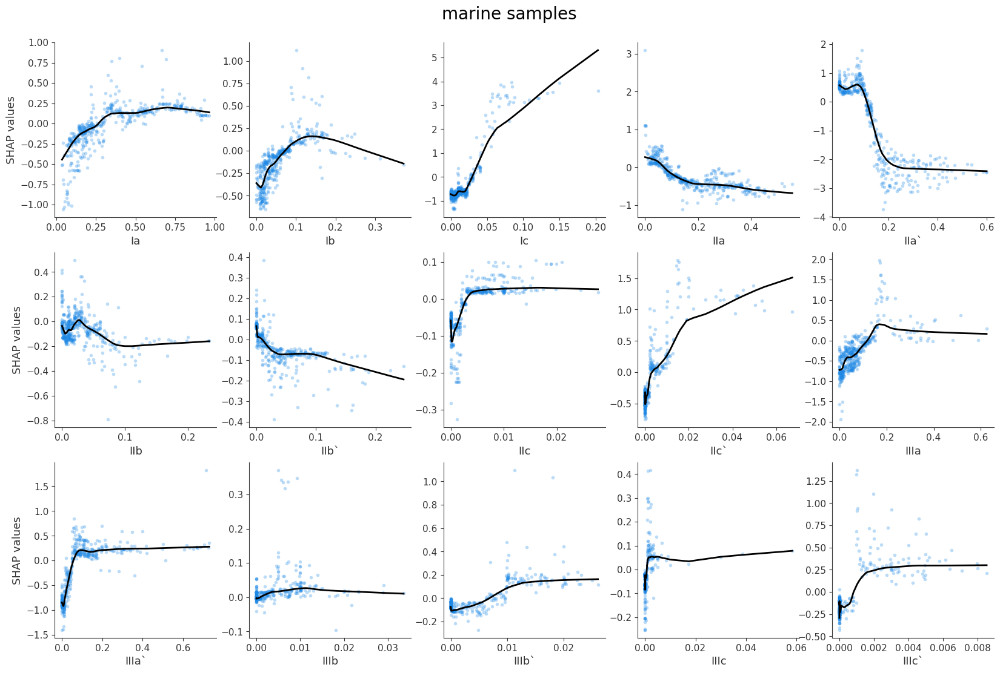

In [76]:
# Subplots of gradient boost SHAP values plotted against individual GDGTs for marine samples
Fig, ((ax1,ax2,ax3,ax4,ax5),(ax6,ax7,ax8,ax9,ax10),(ax11,ax12,ax13,ax14,ax15)) = plt.subplots(3,5)
shap.dependence_plot("Ia", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ia")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ib")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ic")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIb")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("SHAP values")

shap.dependence_plot("IIb`", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIb`")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("")

shap.dependence_plot("IIc", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIc")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIc`")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIa")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIa`")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("SHAP values")

shap.dependence_plot("IIIb", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIb")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIb`")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("")

shap.dependence_plot("IIIc", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIc")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_Ra2[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIc`")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

Fig.suptitle('marine samples', fontsize= 20)
plt.subplots_adjust(top=0.93)
Fig.set_figheight(12)
Fig.set_figwidth(20)
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/8.2 Raberg gradient boost, marine SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

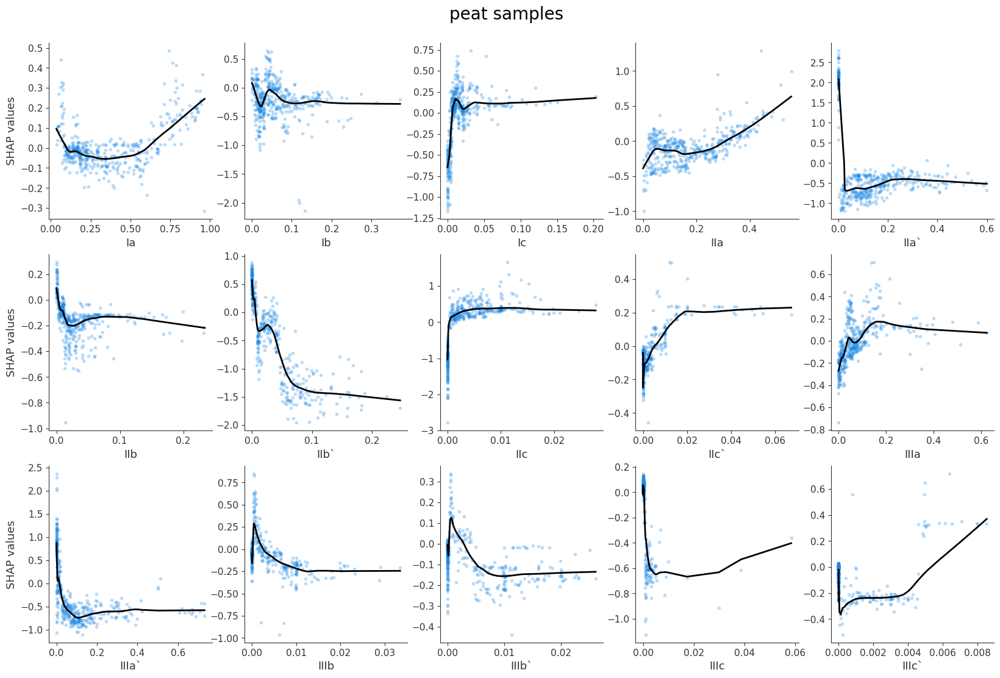

In [77]:
# Subplots of gradient boost SHAP values plotted against individual GDGTs for peat samples
Fig, ((ax1,ax2,ax3,ax4,ax5),(ax6,ax7,ax8,ax9,ax10),(ax11,ax12,ax13,ax14,ax15)) = plt.subplots(3,5)
shap.dependence_plot("Ia", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ia")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ib")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ic")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIb")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("SHAP values")

shap.dependence_plot("IIb`", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIb`")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("")

shap.dependence_plot("IIc", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIc")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIc`")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIa")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIa`")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("SHAP values")

shap.dependence_plot("IIIb", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIb")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIb`")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("")

shap.dependence_plot("IIIc", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIc")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_Ra2[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIc`")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

Fig.suptitle('peat samples', fontsize= 20)
plt.subplots_adjust(top=0.93)
Fig.set_figheight(12)
Fig.set_figwidth(20)
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/8.3 Raberg gradient boost, peat SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

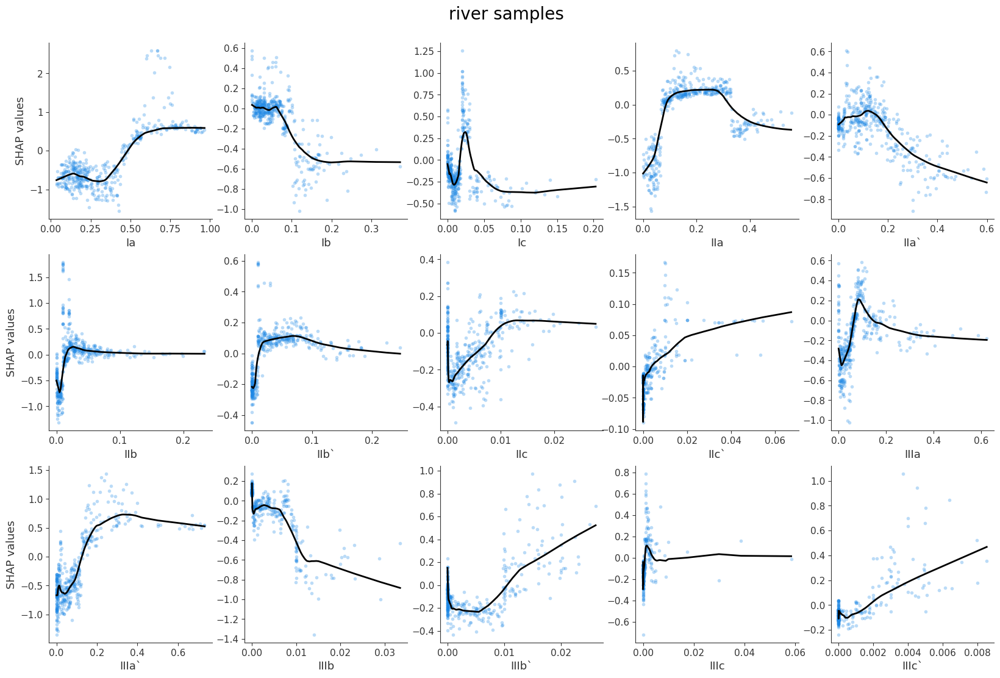

In [78]:
# Subplots of gradient boost SHAP values plotted against individual GDGTs for river samples
Fig, ((ax1,ax2,ax3,ax4,ax5),(ax6,ax7,ax8,ax9,ax10),(ax11,ax12,ax13,ax14,ax15)) = plt.subplots(3,5)
shap.dependence_plot("Ia", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ia")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ib")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ic")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIb")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("SHAP values")

shap.dependence_plot("IIb`", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIb`")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("")

shap.dependence_plot("IIc", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIc")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIc`")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIa")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIa`")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("SHAP values")

shap.dependence_plot("IIIb", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIb")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIb`")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("")

shap.dependence_plot("IIIc", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIc")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_Ra2[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIc`")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

Fig.suptitle('river samples', fontsize= 20)
plt.subplots_adjust(top=0.93)
Fig.set_figheight(12)
Fig.set_figwidth(20)
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/8.4 Raberg gradient boost, river SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

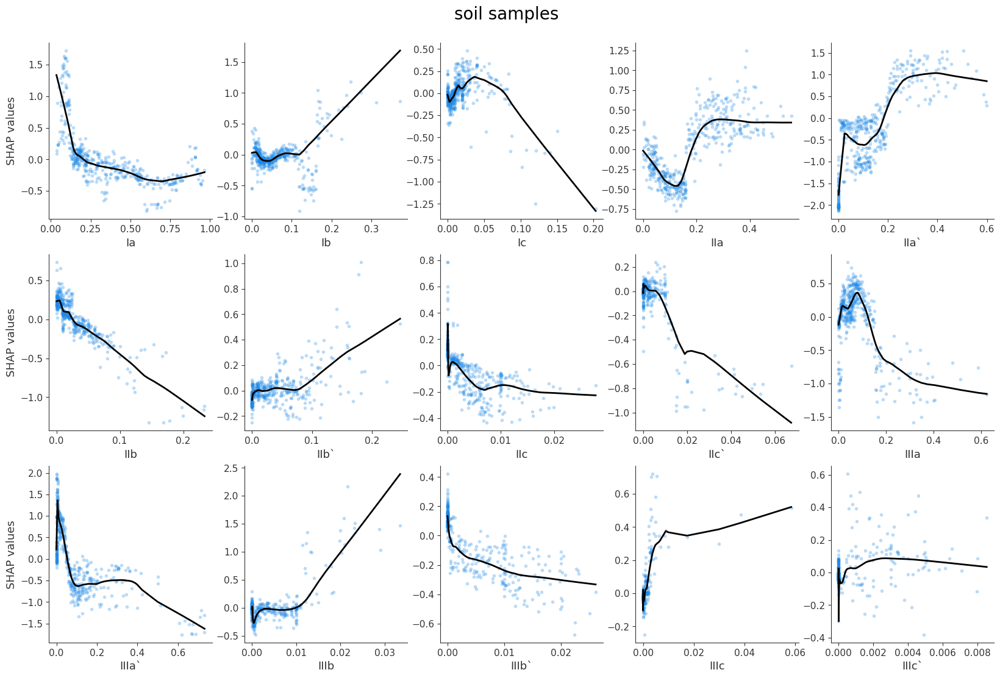

In [79]:
# Subplots of gradient boost SHAP values plotted against individual GDGTs for soil samples
Fig, ((ax1,ax2,ax3,ax4,ax5),(ax6,ax7,ax8,ax9,ax10),(ax11,ax12,ax13,ax14,ax15)) = plt.subplots(3,5)
shap.dependence_plot("Ia", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ia")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ib")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="Ic")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIb")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("SHAP values")

shap.dependence_plot("IIb`", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIb`")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("")

shap.dependence_plot("IIc", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIc")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIc`")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIa")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIa`")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("SHAP values")

shap.dependence_plot("IIIb", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIb")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIb`")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("")

shap.dependence_plot("IIIc", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIc")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_Ra2[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra2[:,np.where(X_Ra1te_df.columns=="IIIc`")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

Fig.suptitle('soil samples', fontsize= 20)
plt.subplots_adjust(top=0.93)
Fig.set_figheight(12)
Fig.set_figwidth(20)
# plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/8.5 Raberg gradient boost, soil SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

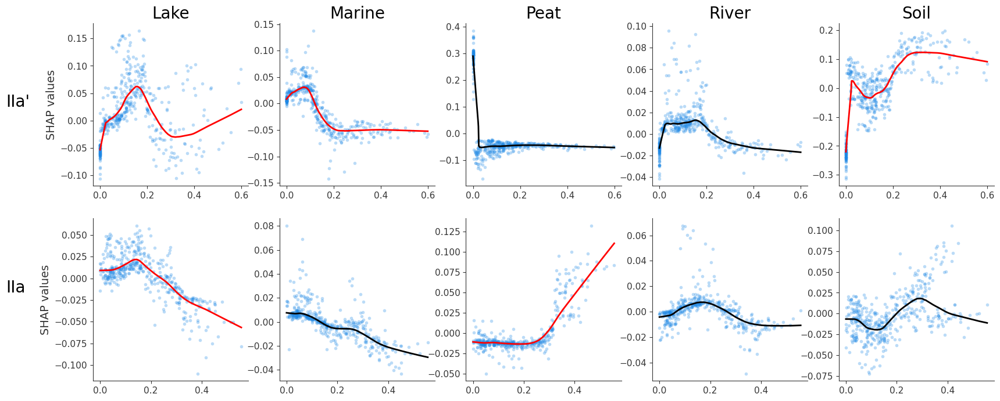

In [96]:
# Subplots of random forest SHAP values for the 2 most important brGDGTs (per permutation importance) for all 5 environment types
Fig, ((ax1,ax2,ax3,ax4,ax5),(ax6,ax7,ax8,ax9,ax10)) = plt.subplots(2,5)
shap.dependence_plot("IIa`", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="red", linewidth= 2)
ax1.set_ylabel("SHAP values", fontsize= 14)
ax1.set_xlabel("")
ax1.set_title("Lake", fontsize= 20)

shap.dependence_plot("IIa`", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="red", linewidth= 2)
ax2.set_ylabel("")
ax2.set_xlabel("")
ax2.set_title("Marine", fontsize= 20)

shap.dependence_plot("IIa`", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")
ax3.set_xlabel("")
ax3.set_title("Peat", fontsize= 20)

shap.dependence_plot("IIa`", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")
ax4.set_xlabel("")
ax4.set_title("River", fontsize= 20)

shap.dependence_plot("IIa`", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa`")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa`")[0][0]], frac=.3))), color="red", linewidth= 2)
ax5.set_ylabel("")
ax5.set_xlabel("")
ax5.set_title("Soil", fontsize= 20)

shap.dependence_plot("IIa", shap_Ra1[:,:,0], X_Ra1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],0], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="red", linewidth= 2)
ax6.set_ylabel("SHAP values", fontsize= 14)
ax6.set_xlabel("")

shap.dependence_plot("IIa", shap_Ra1[:,:,1], X_Ra1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],1], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("")
ax7.set_xlabel("")

shap.dependence_plot("IIa", shap_Ra1[:,:,2], X_Ra1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],2], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="red", linewidth= 2)
ax8.set_ylabel("")
ax8.set_xlabel("")

shap.dependence_plot("IIa", shap_Ra1[:,:,3], X_Ra1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],3], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")
ax9.set_xlabel("")

shap.dependence_plot("IIa", shap_Ra1[:,:,4], X_Ra1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_Ra1[:,np.where(X_Ra1te_df.columns=="IIa")[0][0],4], X_Ra1te_df.iloc[:, np.where(X_Ra1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")
ax10.set_xlabel("")


plt.gcf().text(0.05, 0.7, "IIa'", fontsize=20)
plt.gcf().text(0.05, 0.3, "IIa", fontsize=20)
Fig.set_figheight(8)
Fig.set_figwidth(20)
plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/7.6 Raberg random forest, top compound SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

In [81]:
###
### SHAP values for Martinez-Sosa data compilation
###

In [82]:
# Turn numpy test dataset back to dataframe with labeled column headers.
X_MS1te_df= pd.DataFrame(data= X_MS1te, columns= ['GDGT0', 'GDGT1', 'GDGT2', 'GDGT3', 'Cren', 'Cren`', 'Ia', 'Ib', 'Ic', 'IIa', 'IIa`', 'IIb', 'IIb`', 'IIc', 'IIc`', 'IIIa', 'IIIa`', 'IIIb', 'IIIb`', 'IIIc', 'IIIc`'])

In [83]:
# SHAP values for random forest classification model of Environment type
exp_MS1 = shap.Explainer(RF_MS1)
shap_MS1 = exp_MS1.shap_values(X_MS1te_df)

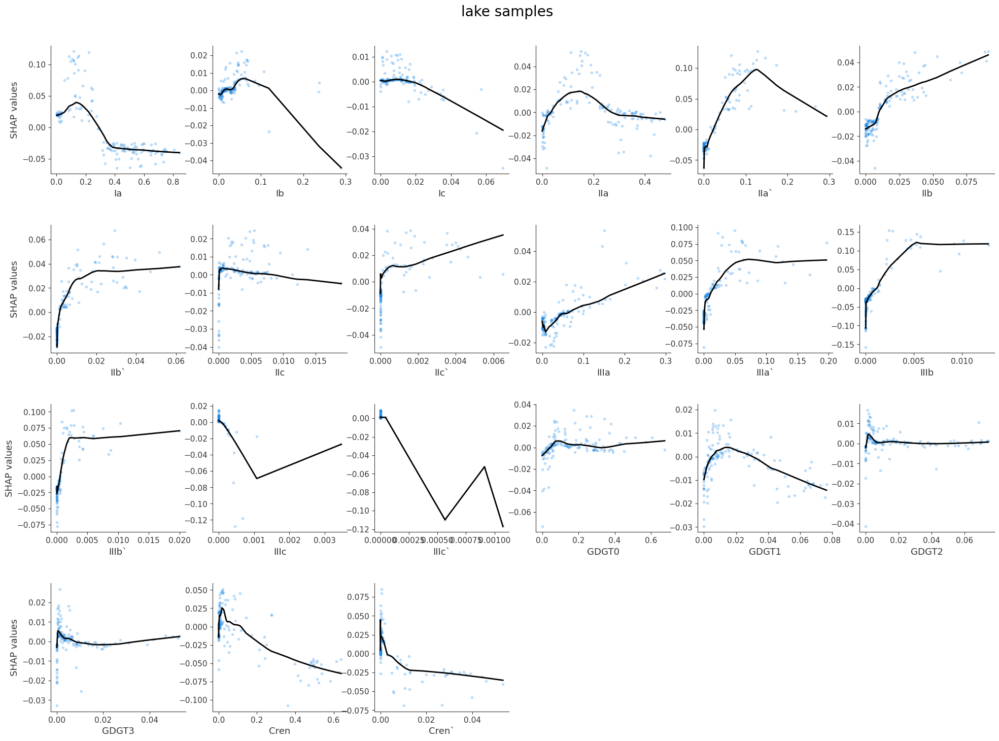

In [84]:
# Subplots of random forest SHAP values plotted against individual GDGTs for lake samples
Fig, ((ax1,ax2,ax3,ax4,ax5,ax6),(ax7,ax8,ax9,ax10,ax11,ax12),(ax13,ax14,ax15,ax16,ax17,ax18),(ax19,ax20,ax21,ax22,ax23,ax24)) = plt.subplots(4,6)
shap.dependence_plot("Ia", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ia")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ib")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ic")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa`")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIb")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("")

shap.dependence_plot("IIb`", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIb`")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("SHAP values")

shap.dependence_plot("IIc", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIc")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIc`")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIa")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIa`")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("")

shap.dependence_plot("IIIb", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIb")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIb`")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("SHAP values")

shap.dependence_plot("IIIc", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIc")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIc`")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

shap.dependence_plot("GDGT0", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax16, alpha= 0.3, show= False)
ax16.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT0")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT0")[0][0]], frac=.3))), color="black", linewidth= 2)
ax16.set_ylabel("")

shap.dependence_plot("GDGT1", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax17, alpha= 0.3, show= False)
ax17.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT1")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT1")[0][0]], frac=.3))), color="black", linewidth= 2)
ax17.set_ylabel("")

shap.dependence_plot("GDGT2", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax18, alpha= 0.3, show= False)
ax18.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT2")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT2")[0][0]], frac=.3))), color="black", linewidth= 2)
ax18.set_ylabel("")

shap.dependence_plot("GDGT3", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax19, alpha= 0.3, show= False)
ax19.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT3")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT3")[0][0]], frac=.3))), color="black", linewidth= 2)
ax19.set_ylabel("SHAP values")

shap.dependence_plot("Cren", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax20, alpha= 0.3, show= False)
ax20.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Cren")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Cren")[0][0]], frac=.3))), color="black", linewidth= 2)
ax20.set_ylabel("")

shap.dependence_plot("Cren`", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax21, alpha= 0.3, show= False)
ax21.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Cren`")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Cren`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax21.set_ylabel("")

ax22.axis('off')
ax23.axis('off')
ax24.axis('off')

Fig.suptitle('lake samples', fontsize= 20)
# Fig.tight_layout()
plt.subplots_adjust(top=0.93)
plt.subplots_adjust(hspace=0.4) #wspace= 0.5
Fig.set_figheight(16)
Fig.set_figwidth(24)
plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/9.1 Martinez-Sosa random forest, lake SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

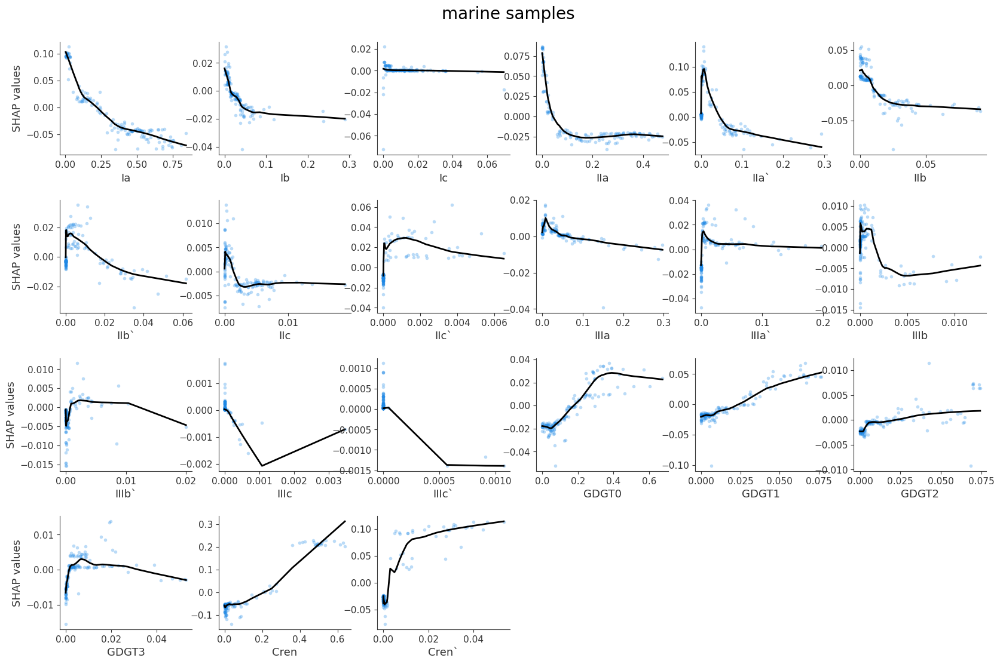

In [85]:
# Subplots of random forest SHAP values plotted against individual GDGTs for marine samples
Fig, ((ax1,ax2,ax3,ax4,ax5,ax6),(ax7,ax8,ax9,ax10,ax11,ax12),(ax13,ax14,ax15,ax16,ax17,ax18),(ax19,ax20,ax21,ax22,ax23,ax24)) = plt.subplots(4,6)
shap.dependence_plot("Ia", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ia")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ib")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ic")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa`")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIb")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("")

shap.dependence_plot("IIb`", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIb`")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("SHAP values")

shap.dependence_plot("IIc", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIc")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIc`")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIa")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIa`")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("")

shap.dependence_plot("IIIb", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIb")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIb`")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("SHAP values")

shap.dependence_plot("IIIc", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIc")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIc`")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

shap.dependence_plot("GDGT0", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax16, alpha= 0.3, show= False)
ax16.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT0")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT0")[0][0]], frac=.3))), color="black", linewidth= 2)
ax16.set_ylabel("")

shap.dependence_plot("GDGT1", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax17, alpha= 0.3, show= False)
ax17.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT1")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT1")[0][0]], frac=.3))), color="black", linewidth= 2)
ax17.set_ylabel("")

shap.dependence_plot("GDGT2", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax18, alpha= 0.3, show= False)
ax18.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT2")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT2")[0][0]], frac=.3))), color="black", linewidth= 2)
ax18.set_ylabel("")

shap.dependence_plot("GDGT3", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax19, alpha= 0.3, show= False)
ax19.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT3")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT3")[0][0]], frac=.3))), color="black", linewidth= 2)
ax19.set_ylabel("SHAP values")

shap.dependence_plot("Cren", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax20, alpha= 0.3, show= False)
ax20.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Cren")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Cren")[0][0]], frac=.3))), color="black", linewidth= 2)
ax20.set_ylabel("")

shap.dependence_plot("Cren`", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax21, alpha= 0.3, show= False)
ax21.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Cren`")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Cren`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax21.set_ylabel("")

ax22.axis('off')
ax23.axis('off')
ax24.axis('off')

Fig.suptitle('marine samples', fontsize= 20)
# Fig.tight_layout()
plt.subplots_adjust(top=0.93)
plt.subplots_adjust(hspace=0.4) #wspace= 0.5
Fig.set_figheight(12)
Fig.set_figwidth(20)
plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/9.2 Martinez-Sosa random forest, marine SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

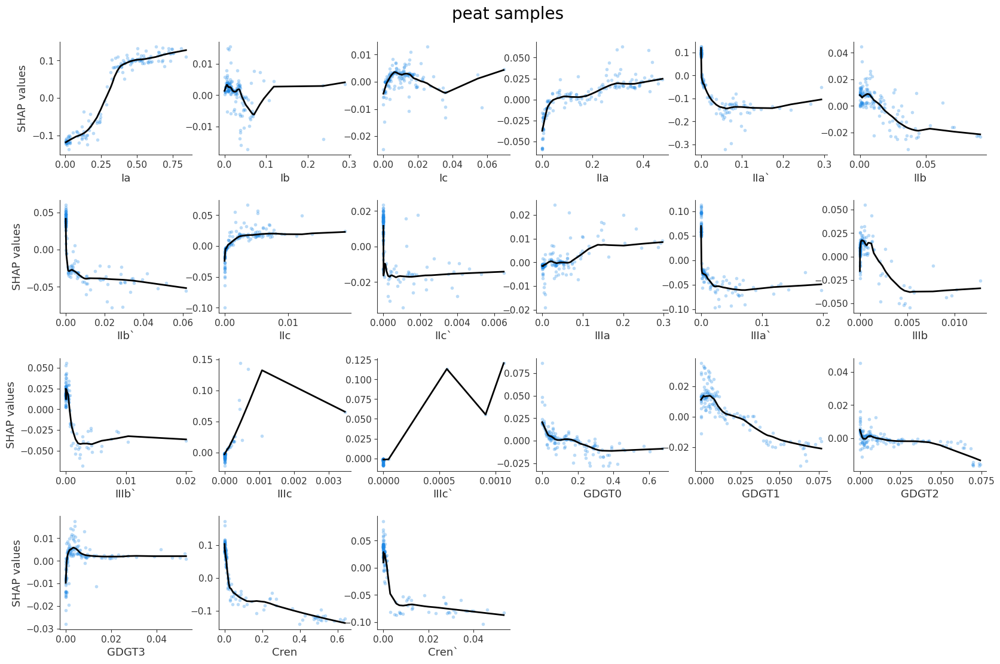

In [86]:
# Subplots of random forest SHAP values plotted against individual GDGTs for peat samples
Fig, ((ax1,ax2,ax3,ax4,ax5,ax6),(ax7,ax8,ax9,ax10,ax11,ax12),(ax13,ax14,ax15,ax16,ax17,ax18),(ax19,ax20,ax21,ax22,ax23,ax24)) = plt.subplots(4,6)
shap.dependence_plot("Ia", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ia")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ib")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ic")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa`")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIb")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("")

shap.dependence_plot("IIb`", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIb`")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("SHAP values")

shap.dependence_plot("IIc", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIc")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIc`")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIa")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIa`")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("")

shap.dependence_plot("IIIb", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIb")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIb`")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("SHAP values")

shap.dependence_plot("IIIc", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIc")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIc`")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

shap.dependence_plot("GDGT0", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax16, alpha= 0.3, show= False)
ax16.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT0")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT0")[0][0]], frac=.3))), color="black", linewidth= 2)
ax16.set_ylabel("")

shap.dependence_plot("GDGT1", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax17, alpha= 0.3, show= False)
ax17.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT1")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT1")[0][0]], frac=.3))), color="black", linewidth= 2)
ax17.set_ylabel("")

shap.dependence_plot("GDGT2", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax18, alpha= 0.3, show= False)
ax18.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT2")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT2")[0][0]], frac=.3))), color="black", linewidth= 2)
ax18.set_ylabel("")

shap.dependence_plot("GDGT3", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax19, alpha= 0.3, show= False)
ax19.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT3")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT3")[0][0]], frac=.3))), color="black", linewidth= 2)
ax19.set_ylabel("SHAP values")

shap.dependence_plot("Cren", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax20, alpha= 0.3, show= False)
ax20.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Cren")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Cren")[0][0]], frac=.3))), color="black", linewidth= 2)
ax20.set_ylabel("")

shap.dependence_plot("Cren`", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax21, alpha= 0.3, show= False)
ax21.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Cren`")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Cren`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax21.set_ylabel("")

ax22.axis('off')
ax23.axis('off')
ax24.axis('off')

Fig.suptitle('peat samples', fontsize= 20)
# Fig.tight_layout()
plt.subplots_adjust(top=0.93)
plt.subplots_adjust(hspace=0.4) #wspace= 0.5
Fig.set_figheight(12)
Fig.set_figwidth(20)
plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/9.3 Martinez-Sosa random forest, peat SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

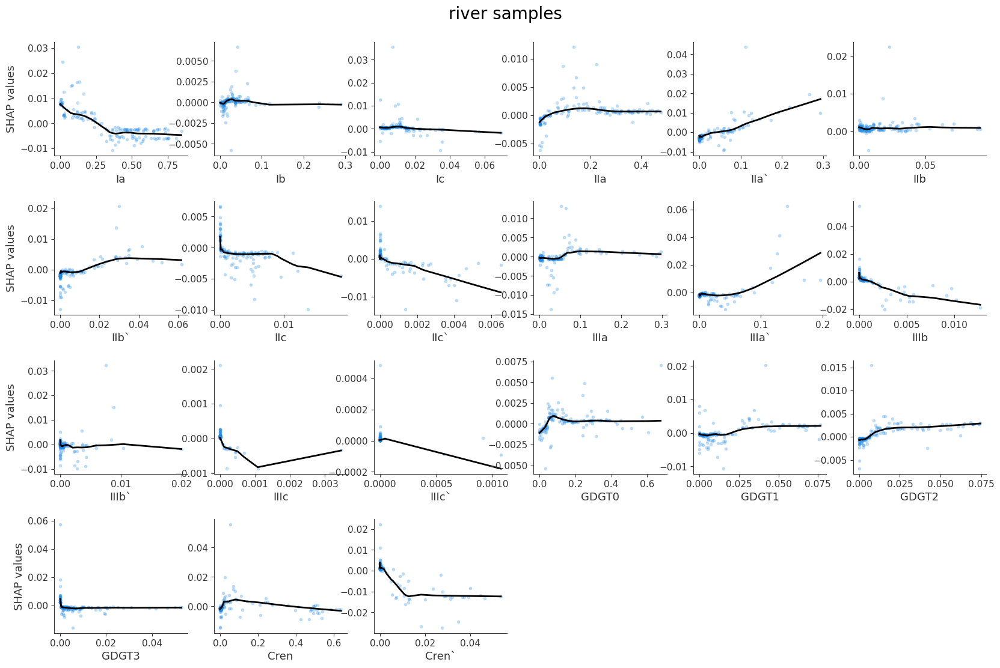

In [87]:
# Subplots of random forest SHAP values plotted against individual GDGTs for river samples
Fig, ((ax1,ax2,ax3,ax4,ax5,ax6),(ax7,ax8,ax9,ax10,ax11,ax12),(ax13,ax14,ax15,ax16,ax17,ax18),(ax19,ax20,ax21,ax22,ax23,ax24)) = plt.subplots(4,6)
shap.dependence_plot("Ia", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ia")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ib")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ic")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa`")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIb")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("")

shap.dependence_plot("IIb`", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIb`")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("SHAP values")

shap.dependence_plot("IIc", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIc")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIc`")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIa")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIa`")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("")

shap.dependence_plot("IIIb", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIb")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIb`")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("SHAP values")

shap.dependence_plot("IIIc", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIc")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIc`")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

shap.dependence_plot("GDGT0", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax16, alpha= 0.3, show= False)
ax16.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT0")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT0")[0][0]], frac=.3))), color="black", linewidth= 2)
ax16.set_ylabel("")

shap.dependence_plot("GDGT1", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax17, alpha= 0.3, show= False)
ax17.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT1")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT1")[0][0]], frac=.3))), color="black", linewidth= 2)
ax17.set_ylabel("")

shap.dependence_plot("GDGT2", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax18, alpha= 0.3, show= False)
ax18.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT2")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT2")[0][0]], frac=.3))), color="black", linewidth= 2)
ax18.set_ylabel("")

shap.dependence_plot("GDGT3", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax19, alpha= 0.3, show= False)
ax19.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT3")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT3")[0][0]], frac=.3))), color="black", linewidth= 2)
ax19.set_ylabel("SHAP values")

shap.dependence_plot("Cren", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax20, alpha= 0.3, show= False)
ax20.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Cren")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Cren")[0][0]], frac=.3))), color="black", linewidth= 2)
ax20.set_ylabel("")

shap.dependence_plot("Cren`", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax21, alpha= 0.3, show= False)
ax21.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Cren`")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Cren`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax21.set_ylabel("")

ax22.axis('off')
ax23.axis('off')
ax24.axis('off')

Fig.suptitle('river samples', fontsize= 20)
# Fig.tight_layout()
plt.subplots_adjust(top=0.93)
plt.subplots_adjust(hspace=0.4) #wspace= 0.5
Fig.set_figheight(12)
Fig.set_figwidth(20)
plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/9.4 Martinez-Sosa random forest, river SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

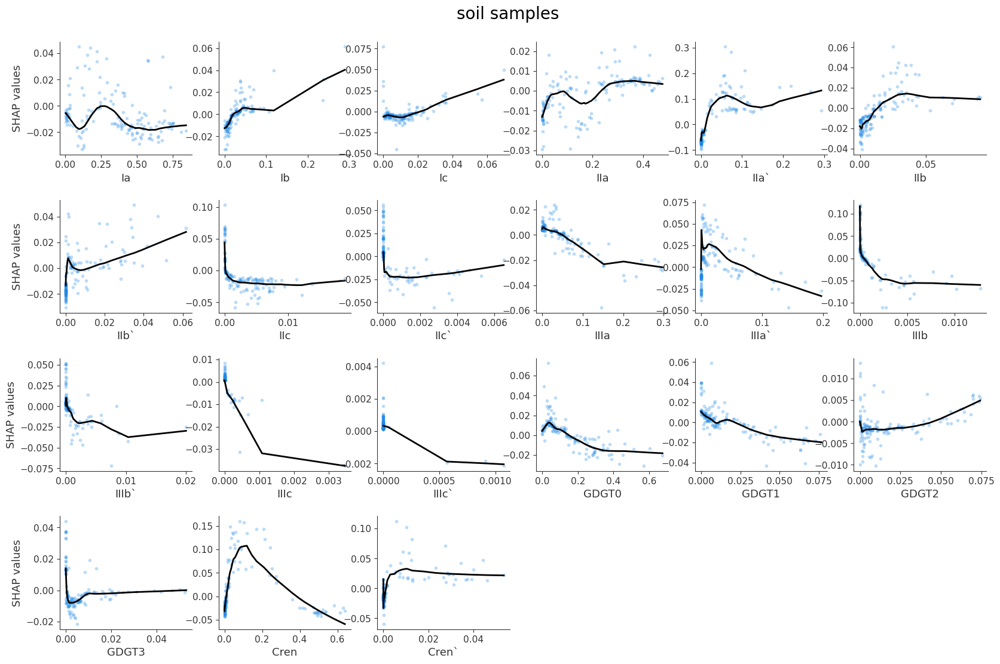

In [88]:
# Subplots of random forest SHAP values plotted against individual GDGTs for soil samples
Fig, ((ax1,ax2,ax3,ax4,ax5,ax6),(ax7,ax8,ax9,ax10,ax11,ax12),(ax13,ax14,ax15,ax16,ax17,ax18),(ax19,ax20,ax21,ax22,ax23,ax24)) = plt.subplots(4,6)
shap.dependence_plot("Ia", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ia")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ia")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values")

shap.dependence_plot("Ib", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ib")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ib")[0][0]], frac=.3))), color="black", linewidth= 2)
ax2.set_ylabel("")

shap.dependence_plot("Ic", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Ic")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Ic")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")

shap.dependence_plot("IIa", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")

shap.dependence_plot("IIa`", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa`")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax5.set_ylabel("")

shap.dependence_plot("IIb", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIb")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax6.set_ylabel("")

shap.dependence_plot("IIb`", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIb`")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax7.set_ylabel("SHAP values")

shap.dependence_plot("IIc", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIc")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")

shap.dependence_plot("IIc`", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIc`")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")

shap.dependence_plot("IIIa", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIa")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")

shap.dependence_plot("IIIa`", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax11, alpha= 0.3, show= False)
ax11.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIa`")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIa`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax11.set_ylabel("")

shap.dependence_plot("IIIb", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax12, alpha= 0.3, show= False)
ax12.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIb")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIb")[0][0]], frac=.3))), color="black", linewidth= 2)
ax12.set_ylabel("")

shap.dependence_plot("IIIb`", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax13, alpha= 0.3, show= False)
ax13.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIb`")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIb`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax13.set_ylabel("SHAP values")

shap.dependence_plot("IIIc", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax14, alpha= 0.3, show= False)
ax14.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIc")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIc")[0][0]], frac=.3))), color="black", linewidth= 2)
ax14.set_ylabel("")

shap.dependence_plot("IIIc`", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax15, alpha= 0.3, show= False)
ax15.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIIc`")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIIc`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax15.set_ylabel("")

shap.dependence_plot("GDGT0", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax16, alpha= 0.3, show= False)
ax16.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT0")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT0")[0][0]], frac=.3))), color="black", linewidth= 2)
ax16.set_ylabel("")

shap.dependence_plot("GDGT1", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax17, alpha= 0.3, show= False)
ax17.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT1")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT1")[0][0]], frac=.3))), color="black", linewidth= 2)
ax17.set_ylabel("")

shap.dependence_plot("GDGT2", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax18, alpha= 0.3, show= False)
ax18.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT2")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT2")[0][0]], frac=.3))), color="black", linewidth= 2)
ax18.set_ylabel("")

shap.dependence_plot("GDGT3", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax19, alpha= 0.3, show= False)
ax19.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT3")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT3")[0][0]], frac=.3))), color="black", linewidth= 2)
ax19.set_ylabel("SHAP values")

shap.dependence_plot("Cren", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax20, alpha= 0.3, show= False)
ax20.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Cren")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Cren")[0][0]], frac=.3))), color="black", linewidth= 2)
ax20.set_ylabel("")

shap.dependence_plot("Cren`", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax21, alpha= 0.3, show= False)
ax21.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="Cren`")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="Cren`")[0][0]], frac=.3))), color="black", linewidth= 2)
ax21.set_ylabel("")

ax22.axis('off')
ax23.axis('off')
ax24.axis('off')

Fig.suptitle('soil samples', fontsize= 20)
# Fig.tight_layout()
plt.subplots_adjust(top=0.93)
plt.subplots_adjust(hspace=0.4) #wspace= 0.5
Fig.set_figheight(12)
Fig.set_figwidth(20)
plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/9.5 Martinez-Sosa random forest, soil SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()

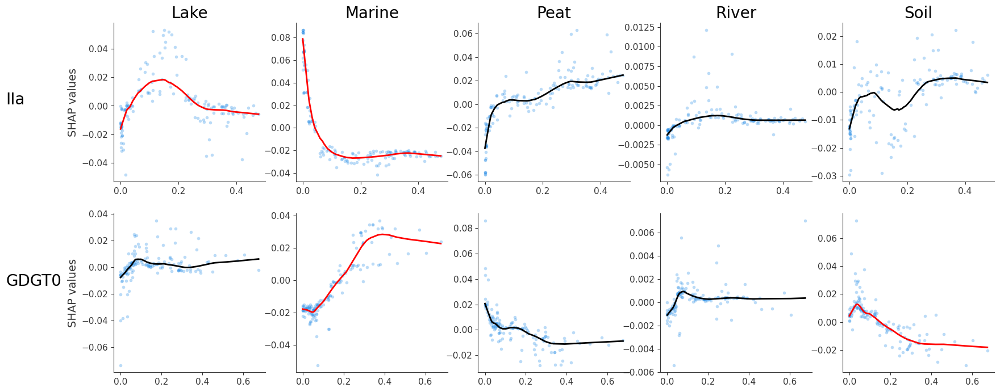

In [94]:
# Subplots of random forest SHAP values for the 2 most important GDGTs (per permutation importance) for all 5 environment types
Fig, ((ax6,ax7,ax8,ax9,ax10),(ax1,ax2,ax3,ax4,ax5)) = plt.subplots(2,5)
shap.dependence_plot("GDGT0", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax1, alpha= 0.3, show= False)
ax1.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT0")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT0")[0][0]], frac=.3))), color="black", linewidth= 2)
ax1.set_ylabel("SHAP values", fontsize= 14)
ax1.set_xlabel("")

shap.dependence_plot("GDGT0", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax2, alpha= 0.3, show= False)
ax2.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT0")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT0")[0][0]], frac=.3))), color="red", linewidth= 2)
ax2.set_ylabel("")
ax2.set_xlabel("")

shap.dependence_plot("GDGT0", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax3, alpha= 0.3, show= False)
ax3.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT0")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT0")[0][0]], frac=.3))), color="black", linewidth= 2)
ax3.set_ylabel("")
ax3.set_xlabel("")

shap.dependence_plot("GDGT0", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax4, alpha= 0.3, show= False)
ax4.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT0")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT0")[0][0]], frac=.3))), color="black", linewidth= 2)
ax4.set_ylabel("")
ax4.set_xlabel("")

shap.dependence_plot("GDGT0", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax5, alpha= 0.3, show= False)
ax5.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="GDGT0")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="GDGT0")[0][0]], frac=.3))), color="red", linewidth= 2)
ax5.set_ylabel("")
ax5.set_xlabel("")

shap.dependence_plot("IIa", shap_MS1[:,:,0], X_MS1te_df, interaction_index = None, ax= ax6, alpha= 0.3, show= False)
ax6.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa")[0][0],0], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa")[0][0]], frac=.3))), color="red", linewidth= 2)
ax6.set_ylabel("SHAP values", fontsize= 14)
ax6.set_xlabel("")
ax6.set_title("Lake", fontsize= 20)

shap.dependence_plot("IIa", shap_MS1[:,:,1], X_MS1te_df, interaction_index = None, ax= ax7, alpha= 0.3, show= False)
ax7.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa")[0][0],1], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa")[0][0]], frac=.3))), color="red", linewidth= 2)
ax7.set_ylabel("")
ax7.set_xlabel("")
ax7.set_title("Marine", fontsize= 20)

shap.dependence_plot("IIa", shap_MS1[:,:,2], X_MS1te_df, interaction_index = None, ax= ax8, alpha= 0.3, show= False)
ax8.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa")[0][0],2], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax8.set_ylabel("")
ax8.set_xlabel("")
ax8.set_title("Peat", fontsize= 20)

shap.dependence_plot("IIa", shap_MS1[:,:,3], X_MS1te_df, interaction_index = None, ax= ax9, alpha= 0.3, show= False)
ax9.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa")[0][0],3], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax9.set_ylabel("")
ax9.set_xlabel("")
ax9.set_title("River", fontsize= 20)

shap.dependence_plot("IIa", shap_MS1[:,:,4], X_MS1te_df, interaction_index = None, ax= ax10, alpha= 0.3, show= False)
ax10.plot(*list(zip(*sm.nonparametric.lowess(shap_MS1[:,np.where(X_MS1te_df.columns=="IIa")[0][0],4], X_MS1te_df.iloc[:, np.where(X_MS1te_df.columns=="IIa")[0][0]], frac=.3))), color="black", linewidth= 2)
ax10.set_ylabel("")
ax10.set_xlabel("")
ax10.set_title("Soil", fontsize= 20)

plt.gcf().text(0.03, 0.3, "GDGT0", fontsize=20)
plt.gcf().text(0.03, 0.7, "IIa", fontsize=20)
Fig.set_figheight(8)
Fig.set_figwidth(20)
plt.savefig(fname= "C:/Users/rache/Documents/University of Southern California/2023-2024 Year 4/GEOL 599 Environmental data science/Final project/Figures/9.6 Martinez-Sosa random forest, top compound SHAP dependence plots.jpg", dpi= 300, bbox_inches= "tight")
plt.show()